# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

# helper.download_extract('mnist', data_dir)
# helper.download_extract('celeba', data_dir)

## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

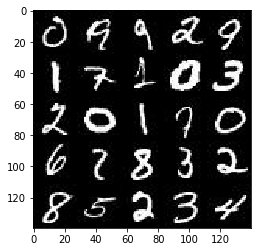

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

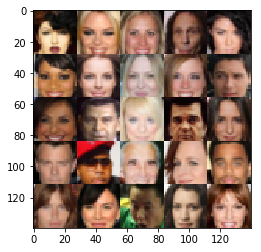

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    image_inputs = tf.placeholder(tf.float32, [None,image_width,image_height,image_channels], name='input_real')
    z_inputs = tf.placeholder(tf.float32, [None,z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return image_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        #28*28*3 Now
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.maximum(0.2 * x1, x1)
        x1 = tf.nn.dropout(x1,0.8)
        #14*14*64 Now
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2,training=True)
        x2 = tf.maximum(0.2 * x2, x2)
        x2 = tf.nn.dropout(x2,0.8)
        #7*7*128
        flat = tf.reshape(x2, (-1, 7*7*128))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse= not is_train):
        
        x1 = tf.layers.dense(z, 7*7*128)
        x1 = tf.reshape(x1, (-1, 7, 7, 128))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2 * x1, x1)
        # 7*7*128 Now
        
        x2 = tf.layers.conv2d_transpose(x1, 64, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2 * x2, x2)
        # 14*14*64
        
#         x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
#         x3 = tf.layers.batch_normalization(x3, training=is_train)
        
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28*28*out_channel_dim
        
        out = 0.5 * tf.tanh(logits)
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    with tf.control_dependencies(update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [22]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, learn_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    saver = tf.train.Saver()
    
    samples, losses = [], []
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                # TODO: Train Model
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_train_opt, feed_dict={input_real:batch_images, input_z:batch_z, learn_rate:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real:batch_images, input_z:batch_z, learn_rate:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real:batch_images, input_z:batch_z, learn_rate:learning_rate})
                
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_real:batch_images, input_z:batch_z})
                    train_loss_g = g_loss.eval({input_z:batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i + 1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                    
                    
                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/2... Discriminator Loss: 3.0044... Generator Loss: 0.2683
Epoch 1/2... Discriminator Loss: 2.7875... Generator Loss: 1.0610
Epoch 1/2... Discriminator Loss: 2.6348... Generator Loss: 0.4489
Epoch 1/2... Discriminator Loss: 2.1211... Generator Loss: 0.2491
Epoch 1/2... Discriminator Loss: 2.1480... Generator Loss: 0.3449
Epoch 1/2... Discriminator Loss: 2.2697... Generator Loss: 0.4252
Epoch 1/2... Discriminator Loss: 2.1121... Generator Loss: 0.4168
Epoch 1/2... Discriminator Loss: 1.9114... Generator Loss: 0.6455
Epoch 1/2... Discriminator Loss: 2.0858... Generator Loss: 0.4733
Epoch 1/2... Discriminator Loss: 2.1707... Generator Loss: 0.3405


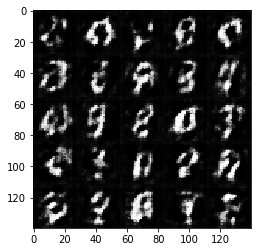

Epoch 1/2... Discriminator Loss: 1.9337... Generator Loss: 0.4889
Epoch 1/2... Discriminator Loss: 2.0289... Generator Loss: 0.4681
Epoch 1/2... Discriminator Loss: 1.9663... Generator Loss: 0.3882
Epoch 1/2... Discriminator Loss: 1.6568... Generator Loss: 0.5285
Epoch 1/2... Discriminator Loss: 1.7100... Generator Loss: 0.5173
Epoch 1/2... Discriminator Loss: 1.8303... Generator Loss: 0.4570
Epoch 1/2... Discriminator Loss: 1.8012... Generator Loss: 0.6970
Epoch 1/2... Discriminator Loss: 1.5071... Generator Loss: 0.7532
Epoch 1/2... Discriminator Loss: 1.6544... Generator Loss: 0.8165
Epoch 1/2... Discriminator Loss: 1.5780... Generator Loss: 0.5965


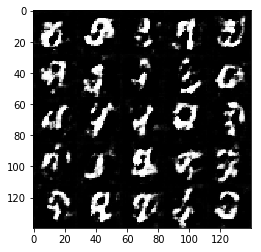

Epoch 1/2... Discriminator Loss: 1.6602... Generator Loss: 0.6836
Epoch 1/2... Discriminator Loss: 1.6092... Generator Loss: 0.5981
Epoch 1/2... Discriminator Loss: 1.7860... Generator Loss: 0.6572
Epoch 1/2... Discriminator Loss: 1.9271... Generator Loss: 0.8775
Epoch 1/2... Discriminator Loss: 1.5712... Generator Loss: 0.7945
Epoch 1/2... Discriminator Loss: 1.5259... Generator Loss: 0.7511
Epoch 1/2... Discriminator Loss: 1.6711... Generator Loss: 0.4986
Epoch 1/2... Discriminator Loss: 1.5440... Generator Loss: 0.9081
Epoch 1/2... Discriminator Loss: 1.4363... Generator Loss: 0.8867
Epoch 1/2... Discriminator Loss: 1.5095... Generator Loss: 0.7716


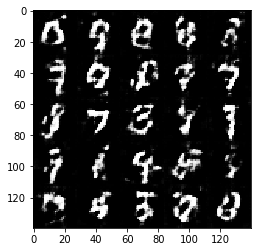

Epoch 1/2... Discriminator Loss: 1.5159... Generator Loss: 0.8445
Epoch 1/2... Discriminator Loss: 1.6147... Generator Loss: 0.6055
Epoch 1/2... Discriminator Loss: 1.5939... Generator Loss: 0.5643
Epoch 1/2... Discriminator Loss: 1.5968... Generator Loss: 0.4249
Epoch 1/2... Discriminator Loss: 1.3500... Generator Loss: 0.8685
Epoch 1/2... Discriminator Loss: 1.5352... Generator Loss: 0.7740
Epoch 1/2... Discriminator Loss: 1.6965... Generator Loss: 0.6680
Epoch 1/2... Discriminator Loss: 1.5901... Generator Loss: 0.6029
Epoch 1/2... Discriminator Loss: 1.5219... Generator Loss: 1.0934
Epoch 1/2... Discriminator Loss: 1.5199... Generator Loss: 0.8503


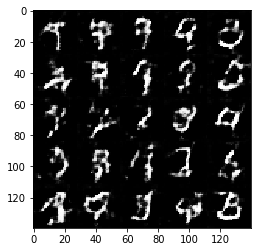

Epoch 1/2... Discriminator Loss: 1.5560... Generator Loss: 0.8318
Epoch 1/2... Discriminator Loss: 1.9379... Generator Loss: 0.8545
Epoch 1/2... Discriminator Loss: 1.6032... Generator Loss: 0.6245
Epoch 1/2... Discriminator Loss: 1.6476... Generator Loss: 0.4662
Epoch 1/2... Discriminator Loss: 1.6142... Generator Loss: 0.6425
Epoch 1/2... Discriminator Loss: 1.5600... Generator Loss: 0.5893
Epoch 1/2... Discriminator Loss: 1.5562... Generator Loss: 0.5679
Epoch 1/2... Discriminator Loss: 1.5394... Generator Loss: 0.6713
Epoch 1/2... Discriminator Loss: 1.5869... Generator Loss: 0.7500
Epoch 1/2... Discriminator Loss: 1.5366... Generator Loss: 0.6776


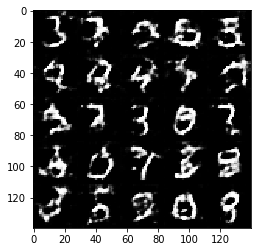

Epoch 1/2... Discriminator Loss: 1.5695... Generator Loss: 0.6272
Epoch 1/2... Discriminator Loss: 1.5530... Generator Loss: 1.1861
Epoch 1/2... Discriminator Loss: 1.3959... Generator Loss: 0.8584
Epoch 1/2... Discriminator Loss: 1.4125... Generator Loss: 0.9325
Epoch 1/2... Discriminator Loss: 1.4053... Generator Loss: 0.8158
Epoch 1/2... Discriminator Loss: 1.5869... Generator Loss: 0.6224
Epoch 1/2... Discriminator Loss: 1.7761... Generator Loss: 0.4354
Epoch 1/2... Discriminator Loss: 1.4208... Generator Loss: 0.9138
Epoch 1/2... Discriminator Loss: 1.7980... Generator Loss: 1.2767
Epoch 1/2... Discriminator Loss: 1.6600... Generator Loss: 0.4957


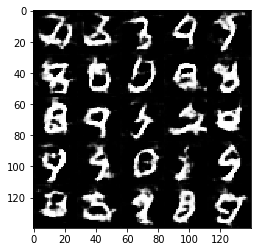

Epoch 1/2... Discriminator Loss: 1.4800... Generator Loss: 0.8089
Epoch 1/2... Discriminator Loss: 1.5512... Generator Loss: 0.5237
Epoch 1/2... Discriminator Loss: 1.6933... Generator Loss: 0.4674
Epoch 1/2... Discriminator Loss: 1.5058... Generator Loss: 0.8301
Epoch 1/2... Discriminator Loss: 1.5315... Generator Loss: 0.6955
Epoch 1/2... Discriminator Loss: 1.7887... Generator Loss: 0.4539
Epoch 1/2... Discriminator Loss: 1.8112... Generator Loss: 0.7340
Epoch 1/2... Discriminator Loss: 1.5802... Generator Loss: 0.6649
Epoch 1/2... Discriminator Loss: 1.5138... Generator Loss: 0.6155
Epoch 1/2... Discriminator Loss: 1.5913... Generator Loss: 0.6888


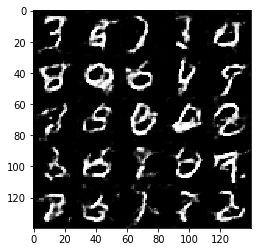

Epoch 1/2... Discriminator Loss: 1.6177... Generator Loss: 0.6176
Epoch 1/2... Discriminator Loss: 1.4126... Generator Loss: 0.9242
Epoch 1/2... Discriminator Loss: 1.7265... Generator Loss: 0.5746
Epoch 1/2... Discriminator Loss: 1.4052... Generator Loss: 0.6902
Epoch 1/2... Discriminator Loss: 1.7311... Generator Loss: 0.3682
Epoch 1/2... Discriminator Loss: 1.4693... Generator Loss: 0.6554
Epoch 1/2... Discriminator Loss: 1.5735... Generator Loss: 0.5946
Epoch 1/2... Discriminator Loss: 1.3086... Generator Loss: 0.9642
Epoch 1/2... Discriminator Loss: 1.4341... Generator Loss: 0.5657
Epoch 1/2... Discriminator Loss: 1.3545... Generator Loss: 0.5480


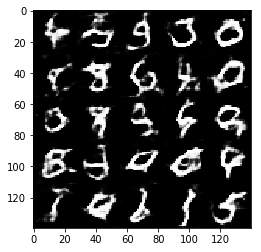

Epoch 1/2... Discriminator Loss: 1.5987... Generator Loss: 0.5540
Epoch 1/2... Discriminator Loss: 1.4269... Generator Loss: 0.6045
Epoch 1/2... Discriminator Loss: 1.4456... Generator Loss: 0.6439
Epoch 1/2... Discriminator Loss: 1.3916... Generator Loss: 0.6616
Epoch 1/2... Discriminator Loss: 1.4632... Generator Loss: 0.9164
Epoch 1/2... Discriminator Loss: 1.6883... Generator Loss: 0.4585
Epoch 1/2... Discriminator Loss: 1.4392... Generator Loss: 0.6010
Epoch 1/2... Discriminator Loss: 1.6670... Generator Loss: 0.5947
Epoch 1/2... Discriminator Loss: 1.3775... Generator Loss: 0.7827
Epoch 1/2... Discriminator Loss: 1.5248... Generator Loss: 0.4641


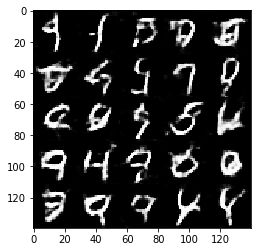

Epoch 1/2... Discriminator Loss: 1.3432... Generator Loss: 0.7920
Epoch 1/2... Discriminator Loss: 1.4873... Generator Loss: 0.6315
Epoch 1/2... Discriminator Loss: 1.5215... Generator Loss: 0.5792
Epoch 1/2... Discriminator Loss: 1.4293... Generator Loss: 0.8701
Epoch 1/2... Discriminator Loss: 1.4974... Generator Loss: 0.8736
Epoch 1/2... Discriminator Loss: 1.5314... Generator Loss: 0.4984
Epoch 1/2... Discriminator Loss: 1.3579... Generator Loss: 0.8056
Epoch 1/2... Discriminator Loss: 1.5950... Generator Loss: 0.8770
Epoch 1/2... Discriminator Loss: 1.6604... Generator Loss: 0.8540
Epoch 1/2... Discriminator Loss: 1.4681... Generator Loss: 0.9620


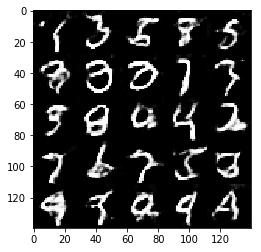

Epoch 1/2... Discriminator Loss: 1.5118... Generator Loss: 0.8089
Epoch 1/2... Discriminator Loss: 1.5146... Generator Loss: 0.6799
Epoch 1/2... Discriminator Loss: 1.5194... Generator Loss: 0.5274
Epoch 1/2... Discriminator Loss: 1.4463... Generator Loss: 0.6331
Epoch 1/2... Discriminator Loss: 1.5923... Generator Loss: 0.9216
Epoch 1/2... Discriminator Loss: 1.6390... Generator Loss: 0.5122
Epoch 1/2... Discriminator Loss: 1.4633... Generator Loss: 0.8652
Epoch 1/2... Discriminator Loss: 1.6309... Generator Loss: 0.5336
Epoch 1/2... Discriminator Loss: 1.5220... Generator Loss: 1.0115
Epoch 1/2... Discriminator Loss: 1.3858... Generator Loss: 0.8486


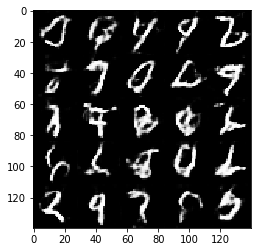

Epoch 1/2... Discriminator Loss: 1.4111... Generator Loss: 0.8053
Epoch 1/2... Discriminator Loss: 1.2906... Generator Loss: 1.1135
Epoch 1/2... Discriminator Loss: 1.2579... Generator Loss: 0.8945
Epoch 1/2... Discriminator Loss: 1.6354... Generator Loss: 0.5570
Epoch 1/2... Discriminator Loss: 1.3571... Generator Loss: 1.1414
Epoch 1/2... Discriminator Loss: 1.3566... Generator Loss: 0.9911
Epoch 1/2... Discriminator Loss: 1.4916... Generator Loss: 0.5818
Epoch 1/2... Discriminator Loss: 1.5389... Generator Loss: 0.6682
Epoch 1/2... Discriminator Loss: 1.3323... Generator Loss: 0.9296
Epoch 1/2... Discriminator Loss: 1.5357... Generator Loss: 0.5567


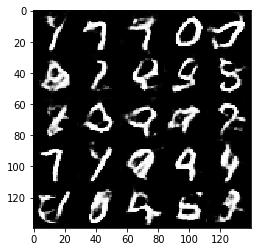

Epoch 1/2... Discriminator Loss: 1.3783... Generator Loss: 0.7013
Epoch 1/2... Discriminator Loss: 1.3335... Generator Loss: 0.6734
Epoch 1/2... Discriminator Loss: 1.3729... Generator Loss: 0.8369
Epoch 1/2... Discriminator Loss: 1.3906... Generator Loss: 0.8111
Epoch 1/2... Discriminator Loss: 1.4621... Generator Loss: 0.6452
Epoch 1/2... Discriminator Loss: 1.3456... Generator Loss: 0.7480
Epoch 1/2... Discriminator Loss: 1.3064... Generator Loss: 0.8374
Epoch 1/2... Discriminator Loss: 1.4367... Generator Loss: 1.0486
Epoch 1/2... Discriminator Loss: 1.3699... Generator Loss: 0.8210
Epoch 1/2... Discriminator Loss: 1.5210... Generator Loss: 1.2853


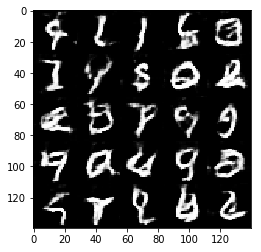

Epoch 1/2... Discriminator Loss: 1.5155... Generator Loss: 0.5921
Epoch 1/2... Discriminator Loss: 1.2746... Generator Loss: 0.7445
Epoch 1/2... Discriminator Loss: 1.2995... Generator Loss: 0.6621
Epoch 1/2... Discriminator Loss: 1.5046... Generator Loss: 0.6096
Epoch 1/2... Discriminator Loss: 1.5511... Generator Loss: 0.6731
Epoch 1/2... Discriminator Loss: 1.6756... Generator Loss: 0.5835
Epoch 1/2... Discriminator Loss: 1.5451... Generator Loss: 0.6500
Epoch 1/2... Discriminator Loss: 1.4311... Generator Loss: 0.6817
Epoch 1/2... Discriminator Loss: 1.1861... Generator Loss: 0.8118
Epoch 1/2... Discriminator Loss: 1.3844... Generator Loss: 0.9045


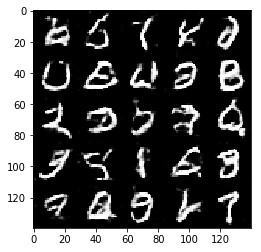

Epoch 1/2... Discriminator Loss: 1.3683... Generator Loss: 0.9793
Epoch 1/2... Discriminator Loss: 1.4658... Generator Loss: 1.0265
Epoch 1/2... Discriminator Loss: 1.4813... Generator Loss: 0.5695
Epoch 1/2... Discriminator Loss: 1.6396... Generator Loss: 0.4495
Epoch 1/2... Discriminator Loss: 1.6138... Generator Loss: 0.4841
Epoch 1/2... Discriminator Loss: 1.3046... Generator Loss: 0.8283
Epoch 1/2... Discriminator Loss: 1.4487... Generator Loss: 0.8678
Epoch 1/2... Discriminator Loss: 1.4411... Generator Loss: 0.6588
Epoch 1/2... Discriminator Loss: 1.3684... Generator Loss: 0.7251
Epoch 1/2... Discriminator Loss: 1.5583... Generator Loss: 0.4665


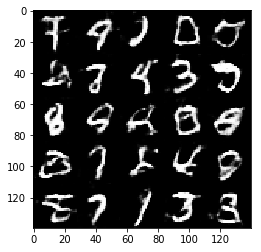

Epoch 1/2... Discriminator Loss: 1.4465... Generator Loss: 0.5189
Epoch 1/2... Discriminator Loss: 1.3334... Generator Loss: 0.9894
Epoch 1/2... Discriminator Loss: 1.4544... Generator Loss: 1.0978
Epoch 1/2... Discriminator Loss: 1.3547... Generator Loss: 0.7170
Epoch 1/2... Discriminator Loss: 1.3669... Generator Loss: 0.7868
Epoch 1/2... Discriminator Loss: 1.4897... Generator Loss: 0.6038
Epoch 1/2... Discriminator Loss: 1.4695... Generator Loss: 1.2271
Epoch 1/2... Discriminator Loss: 1.4027... Generator Loss: 0.7494
Epoch 1/2... Discriminator Loss: 1.5057... Generator Loss: 0.5593
Epoch 1/2... Discriminator Loss: 1.5260... Generator Loss: 0.4933


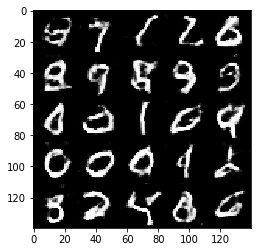

Epoch 1/2... Discriminator Loss: 1.3519... Generator Loss: 0.6996
Epoch 1/2... Discriminator Loss: 1.2945... Generator Loss: 0.6177
Epoch 1/2... Discriminator Loss: 1.4304... Generator Loss: 0.8469
Epoch 1/2... Discriminator Loss: 1.2045... Generator Loss: 0.9116
Epoch 1/2... Discriminator Loss: 1.4466... Generator Loss: 1.0058
Epoch 1/2... Discriminator Loss: 1.1624... Generator Loss: 1.1033
Epoch 1/2... Discriminator Loss: 1.6231... Generator Loss: 0.5398
Epoch 1/2... Discriminator Loss: 1.7214... Generator Loss: 1.1583
Epoch 1/2... Discriminator Loss: 1.5146... Generator Loss: 0.6173
Epoch 1/2... Discriminator Loss: 1.2497... Generator Loss: 1.3770


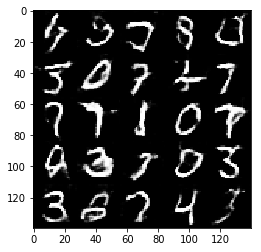

Epoch 1/2... Discriminator Loss: 1.4237... Generator Loss: 0.8967
Epoch 1/2... Discriminator Loss: 1.2464... Generator Loss: 0.7632
Epoch 1/2... Discriminator Loss: 1.2597... Generator Loss: 0.9348
Epoch 1/2... Discriminator Loss: 1.3331... Generator Loss: 1.2858
Epoch 1/2... Discriminator Loss: 1.6172... Generator Loss: 0.4815
Epoch 1/2... Discriminator Loss: 1.4090... Generator Loss: 0.9050
Epoch 1/2... Discriminator Loss: 1.3147... Generator Loss: 0.8646
Epoch 1/2... Discriminator Loss: 1.2693... Generator Loss: 0.7812
Epoch 1/2... Discriminator Loss: 1.3842... Generator Loss: 0.8672
Epoch 1/2... Discriminator Loss: 1.5425... Generator Loss: 0.4669


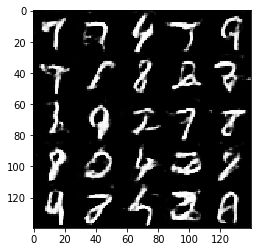

Epoch 1/2... Discriminator Loss: 1.2709... Generator Loss: 1.0621
Epoch 1/2... Discriminator Loss: 1.4049... Generator Loss: 0.6016
Epoch 1/2... Discriminator Loss: 1.3158... Generator Loss: 0.9460
Epoch 1/2... Discriminator Loss: 1.2749... Generator Loss: 0.9986
Epoch 1/2... Discriminator Loss: 1.6561... Generator Loss: 0.3703
Epoch 1/2... Discriminator Loss: 1.2196... Generator Loss: 1.0591
Epoch 1/2... Discriminator Loss: 1.2699... Generator Loss: 1.2129
Epoch 2/2... Discriminator Loss: 1.3006... Generator Loss: 0.9804
Epoch 2/2... Discriminator Loss: 1.5116... Generator Loss: 0.5685
Epoch 2/2... Discriminator Loss: 1.5094... Generator Loss: 0.5358


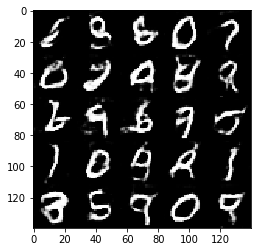

Epoch 2/2... Discriminator Loss: 1.5171... Generator Loss: 0.7583
Epoch 2/2... Discriminator Loss: 1.2623... Generator Loss: 1.1419
Epoch 2/2... Discriminator Loss: 1.4713... Generator Loss: 0.6590
Epoch 2/2... Discriminator Loss: 1.8710... Generator Loss: 0.3314
Epoch 2/2... Discriminator Loss: 1.3992... Generator Loss: 0.5943
Epoch 2/2... Discriminator Loss: 1.4126... Generator Loss: 1.0327
Epoch 2/2... Discriminator Loss: 1.4367... Generator Loss: 0.7132
Epoch 2/2... Discriminator Loss: 1.1607... Generator Loss: 1.0510
Epoch 2/2... Discriminator Loss: 1.2403... Generator Loss: 1.3477
Epoch 2/2... Discriminator Loss: 1.2918... Generator Loss: 0.8116


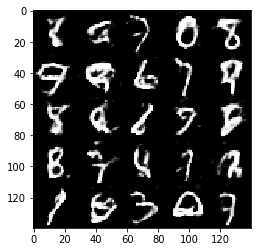

Epoch 2/2... Discriminator Loss: 1.4085... Generator Loss: 0.6760
Epoch 2/2... Discriminator Loss: 1.3918... Generator Loss: 1.3914
Epoch 2/2... Discriminator Loss: 1.4297... Generator Loss: 0.8904
Epoch 2/2... Discriminator Loss: 1.3713... Generator Loss: 0.5522
Epoch 2/2... Discriminator Loss: 2.1220... Generator Loss: 0.3455
Epoch 2/2... Discriminator Loss: 1.3621... Generator Loss: 0.9364
Epoch 2/2... Discriminator Loss: 1.5752... Generator Loss: 0.6148
Epoch 2/2... Discriminator Loss: 1.4963... Generator Loss: 1.3300
Epoch 2/2... Discriminator Loss: 1.3155... Generator Loss: 0.8258
Epoch 2/2... Discriminator Loss: 1.2543... Generator Loss: 0.8669


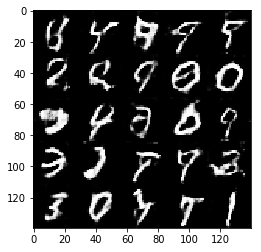

Epoch 2/2... Discriminator Loss: 1.2545... Generator Loss: 0.9581
Epoch 2/2... Discriminator Loss: 1.3161... Generator Loss: 0.6681
Epoch 2/2... Discriminator Loss: 1.3673... Generator Loss: 0.8024
Epoch 2/2... Discriminator Loss: 1.2904... Generator Loss: 1.3210
Epoch 2/2... Discriminator Loss: 2.0560... Generator Loss: 2.0571
Epoch 2/2... Discriminator Loss: 1.5447... Generator Loss: 0.6323
Epoch 2/2... Discriminator Loss: 1.3294... Generator Loss: 1.1937
Epoch 2/2... Discriminator Loss: 1.4435... Generator Loss: 0.8298
Epoch 2/2... Discriminator Loss: 1.3163... Generator Loss: 0.7050
Epoch 2/2... Discriminator Loss: 1.4766... Generator Loss: 0.6498


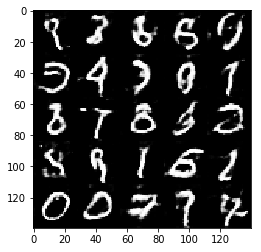

Epoch 2/2... Discriminator Loss: 1.4771... Generator Loss: 0.6849
Epoch 2/2... Discriminator Loss: 1.2899... Generator Loss: 1.1554
Epoch 2/2... Discriminator Loss: 1.3315... Generator Loss: 1.1299
Epoch 2/2... Discriminator Loss: 1.4142... Generator Loss: 0.5423
Epoch 2/2... Discriminator Loss: 1.3280... Generator Loss: 0.5972
Epoch 2/2... Discriminator Loss: 1.5793... Generator Loss: 0.4598
Epoch 2/2... Discriminator Loss: 1.1015... Generator Loss: 0.8591
Epoch 2/2... Discriminator Loss: 1.5479... Generator Loss: 1.1597
Epoch 2/2... Discriminator Loss: 1.3038... Generator Loss: 0.9650
Epoch 2/2... Discriminator Loss: 1.1297... Generator Loss: 1.1610


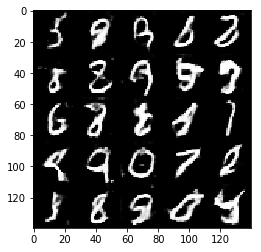

Epoch 2/2... Discriminator Loss: 1.1825... Generator Loss: 1.0524
Epoch 2/2... Discriminator Loss: 1.5954... Generator Loss: 0.4428
Epoch 2/2... Discriminator Loss: 2.1825... Generator Loss: 2.1311
Epoch 2/2... Discriminator Loss: 1.2706... Generator Loss: 0.9648
Epoch 2/2... Discriminator Loss: 1.2580... Generator Loss: 1.0198
Epoch 2/2... Discriminator Loss: 1.1623... Generator Loss: 0.7516
Epoch 2/2... Discriminator Loss: 1.2968... Generator Loss: 1.1756
Epoch 2/2... Discriminator Loss: 1.1866... Generator Loss: 0.7460
Epoch 2/2... Discriminator Loss: 1.1132... Generator Loss: 1.4592
Epoch 2/2... Discriminator Loss: 1.1872... Generator Loss: 0.9439


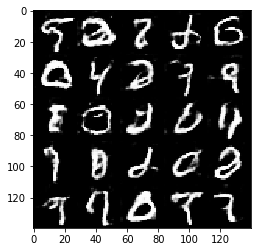

Epoch 2/2... Discriminator Loss: 1.3889... Generator Loss: 0.8595
Epoch 2/2... Discriminator Loss: 1.4904... Generator Loss: 0.7589
Epoch 2/2... Discriminator Loss: 1.4589... Generator Loss: 0.7983
Epoch 2/2... Discriminator Loss: 1.2908... Generator Loss: 0.9171
Epoch 2/2... Discriminator Loss: 1.2732... Generator Loss: 1.0389
Epoch 2/2... Discriminator Loss: 1.4755... Generator Loss: 0.7976
Epoch 2/2... Discriminator Loss: 1.5006... Generator Loss: 0.6841
Epoch 2/2... Discriminator Loss: 1.1199... Generator Loss: 0.8381
Epoch 2/2... Discriminator Loss: 1.3659... Generator Loss: 0.9988
Epoch 2/2... Discriminator Loss: 1.2415... Generator Loss: 0.6339


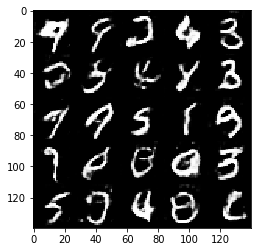

Epoch 2/2... Discriminator Loss: 1.8538... Generator Loss: 0.4478
Epoch 2/2... Discriminator Loss: 1.1967... Generator Loss: 1.1059
Epoch 2/2... Discriminator Loss: 1.4916... Generator Loss: 0.7497
Epoch 2/2... Discriminator Loss: 1.5344... Generator Loss: 0.6122
Epoch 2/2... Discriminator Loss: 1.2856... Generator Loss: 0.7842
Epoch 2/2... Discriminator Loss: 1.4643... Generator Loss: 0.7354
Epoch 2/2... Discriminator Loss: 1.1885... Generator Loss: 0.8942
Epoch 2/2... Discriminator Loss: 1.0018... Generator Loss: 1.1497
Epoch 2/2... Discriminator Loss: 1.5186... Generator Loss: 0.7767
Epoch 2/2... Discriminator Loss: 1.2908... Generator Loss: 0.9097


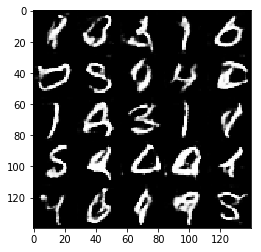

Epoch 2/2... Discriminator Loss: 1.8203... Generator Loss: 0.4396
Epoch 2/2... Discriminator Loss: 1.2334... Generator Loss: 0.7784
Epoch 2/2... Discriminator Loss: 1.4214... Generator Loss: 1.5623
Epoch 2/2... Discriminator Loss: 1.3437... Generator Loss: 0.9049
Epoch 2/2... Discriminator Loss: 1.1153... Generator Loss: 1.1833
Epoch 2/2... Discriminator Loss: 1.4423... Generator Loss: 0.6830
Epoch 2/2... Discriminator Loss: 1.2834... Generator Loss: 1.5211
Epoch 2/2... Discriminator Loss: 1.3851... Generator Loss: 0.5731
Epoch 2/2... Discriminator Loss: 1.2870... Generator Loss: 0.7714
Epoch 2/2... Discriminator Loss: 1.5554... Generator Loss: 2.1889


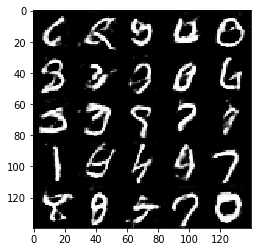

Epoch 2/2... Discriminator Loss: 1.6233... Generator Loss: 0.5924
Epoch 2/2... Discriminator Loss: 1.1111... Generator Loss: 0.8553
Epoch 2/2... Discriminator Loss: 2.0227... Generator Loss: 0.2745
Epoch 2/2... Discriminator Loss: 1.3397... Generator Loss: 1.0168
Epoch 2/2... Discriminator Loss: 1.4404... Generator Loss: 0.4874
Epoch 2/2... Discriminator Loss: 1.2883... Generator Loss: 0.9812
Epoch 2/2... Discriminator Loss: 1.3440... Generator Loss: 1.3147
Epoch 2/2... Discriminator Loss: 1.3640... Generator Loss: 0.7628
Epoch 2/2... Discriminator Loss: 1.2202... Generator Loss: 0.9072
Epoch 2/2... Discriminator Loss: 1.0772... Generator Loss: 1.0812


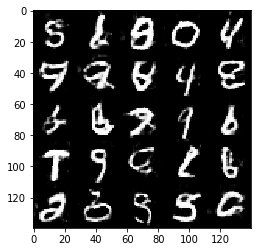

Epoch 2/2... Discriminator Loss: 1.4668... Generator Loss: 0.7843
Epoch 2/2... Discriminator Loss: 1.5501... Generator Loss: 0.4638
Epoch 2/2... Discriminator Loss: 1.0558... Generator Loss: 1.1077
Epoch 2/2... Discriminator Loss: 1.3911... Generator Loss: 0.7469
Epoch 2/2... Discriminator Loss: 1.2482... Generator Loss: 0.7425
Epoch 2/2... Discriminator Loss: 1.7399... Generator Loss: 0.4492
Epoch 2/2... Discriminator Loss: 1.1843... Generator Loss: 0.9730
Epoch 2/2... Discriminator Loss: 1.1544... Generator Loss: 1.2261
Epoch 2/2... Discriminator Loss: 1.2111... Generator Loss: 0.8742
Epoch 2/2... Discriminator Loss: 1.3834... Generator Loss: 0.8956


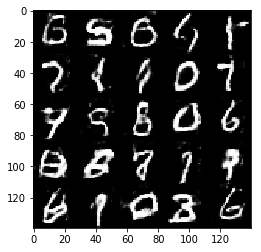

Epoch 2/2... Discriminator Loss: 1.2622... Generator Loss: 0.9716
Epoch 2/2... Discriminator Loss: 1.2057... Generator Loss: 0.9732
Epoch 2/2... Discriminator Loss: 1.3169... Generator Loss: 0.8165
Epoch 2/2... Discriminator Loss: 1.6572... Generator Loss: 0.3713
Epoch 2/2... Discriminator Loss: 1.5325... Generator Loss: 0.5108
Epoch 2/2... Discriminator Loss: 1.2235... Generator Loss: 0.8537
Epoch 2/2... Discriminator Loss: 1.3041... Generator Loss: 1.0054
Epoch 2/2... Discriminator Loss: 1.3533... Generator Loss: 0.6604
Epoch 2/2... Discriminator Loss: 1.1614... Generator Loss: 1.0168
Epoch 2/2... Discriminator Loss: 1.2522... Generator Loss: 0.8798


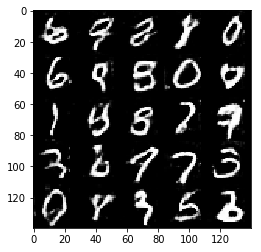

Epoch 2/2... Discriminator Loss: 1.6457... Generator Loss: 0.5091
Epoch 2/2... Discriminator Loss: 1.2378... Generator Loss: 0.6892
Epoch 2/2... Discriminator Loss: 1.2415... Generator Loss: 1.0164
Epoch 2/2... Discriminator Loss: 1.4631... Generator Loss: 0.7297
Epoch 2/2... Discriminator Loss: 1.3821... Generator Loss: 0.7582
Epoch 2/2... Discriminator Loss: 1.3319... Generator Loss: 1.2363
Epoch 2/2... Discriminator Loss: 1.5730... Generator Loss: 1.8375
Epoch 2/2... Discriminator Loss: 1.3706... Generator Loss: 1.8594
Epoch 2/2... Discriminator Loss: 1.3135... Generator Loss: 1.2104
Epoch 2/2... Discriminator Loss: 1.5415... Generator Loss: 0.5558


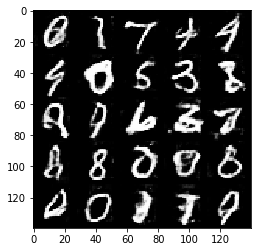

Epoch 2/2... Discriminator Loss: 1.4555... Generator Loss: 1.1981
Epoch 2/2... Discriminator Loss: 1.2992... Generator Loss: 0.5685
Epoch 2/2... Discriminator Loss: 1.3461... Generator Loss: 1.6908
Epoch 2/2... Discriminator Loss: 1.3069... Generator Loss: 1.5056
Epoch 2/2... Discriminator Loss: 1.1801... Generator Loss: 0.8406
Epoch 2/2... Discriminator Loss: 1.0533... Generator Loss: 1.2695
Epoch 2/2... Discriminator Loss: 1.3868... Generator Loss: 0.6982
Epoch 2/2... Discriminator Loss: 1.5757... Generator Loss: 0.5523
Epoch 2/2... Discriminator Loss: 1.2707... Generator Loss: 0.7374
Epoch 2/2... Discriminator Loss: 1.1996... Generator Loss: 1.2011


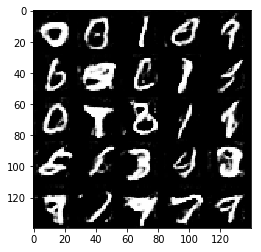

Epoch 2/2... Discriminator Loss: 1.3743... Generator Loss: 0.5926
Epoch 2/2... Discriminator Loss: 1.3510... Generator Loss: 0.9387
Epoch 2/2... Discriminator Loss: 1.4817... Generator Loss: 0.6039
Epoch 2/2... Discriminator Loss: 1.5701... Generator Loss: 0.7039
Epoch 2/2... Discriminator Loss: 1.2209... Generator Loss: 0.6678
Epoch 2/2... Discriminator Loss: 1.2707... Generator Loss: 1.1527
Epoch 2/2... Discriminator Loss: 1.2444... Generator Loss: 0.6178
Epoch 2/2... Discriminator Loss: 1.0375... Generator Loss: 1.3002
Epoch 2/2... Discriminator Loss: 1.3653... Generator Loss: 1.2723
Epoch 2/2... Discriminator Loss: 1.5873... Generator Loss: 1.8373


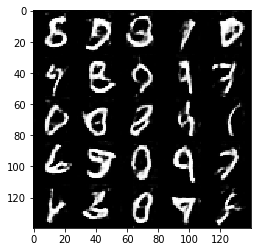

Epoch 2/2... Discriminator Loss: 1.2238... Generator Loss: 0.7029
Epoch 2/2... Discriminator Loss: 1.1967... Generator Loss: 0.8793
Epoch 2/2... Discriminator Loss: 1.3512... Generator Loss: 1.9840
Epoch 2/2... Discriminator Loss: 1.4573... Generator Loss: 1.2717
Epoch 2/2... Discriminator Loss: 1.2481... Generator Loss: 0.8705
Epoch 2/2... Discriminator Loss: 1.1262... Generator Loss: 1.5066
Epoch 2/2... Discriminator Loss: 1.0183... Generator Loss: 1.2533
Epoch 2/2... Discriminator Loss: 1.4549... Generator Loss: 0.7737
Epoch 2/2... Discriminator Loss: 1.1904... Generator Loss: 0.7772
Epoch 2/2... Discriminator Loss: 1.3579... Generator Loss: 0.7843


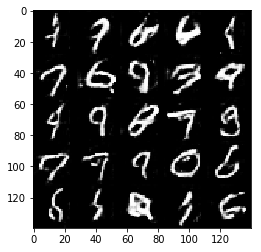

Epoch 2/2... Discriminator Loss: 1.3495... Generator Loss: 0.6348
Epoch 2/2... Discriminator Loss: 1.2883... Generator Loss: 1.0996
Epoch 2/2... Discriminator Loss: 1.3013... Generator Loss: 0.6948
Epoch 2/2... Discriminator Loss: 1.1333... Generator Loss: 1.1805
Epoch 2/2... Discriminator Loss: 1.3867... Generator Loss: 1.4701
Epoch 2/2... Discriminator Loss: 1.3862... Generator Loss: 1.2724
Epoch 2/2... Discriminator Loss: 1.0772... Generator Loss: 1.0926
Epoch 2/2... Discriminator Loss: 1.3811... Generator Loss: 1.1504
Epoch 2/2... Discriminator Loss: 1.6090... Generator Loss: 0.8140
Epoch 2/2... Discriminator Loss: 1.1055... Generator Loss: 0.9077


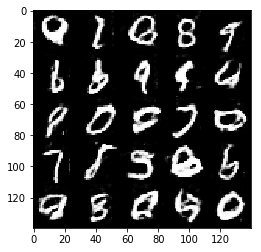

Epoch 2/2... Discriminator Loss: 1.6882... Generator Loss: 0.4293
Epoch 2/2... Discriminator Loss: 1.2523... Generator Loss: 1.5998
Epoch 2/2... Discriminator Loss: 1.4859... Generator Loss: 0.9762
Epoch 2/2... Discriminator Loss: 1.1499... Generator Loss: 1.2892
Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 1.0384
Epoch 2/2... Discriminator Loss: 1.3087... Generator Loss: 0.9017
Epoch 2/2... Discriminator Loss: 1.2966... Generator Loss: 0.8455
Epoch 2/2... Discriminator Loss: 1.2814... Generator Loss: 1.1562
Epoch 2/2... Discriminator Loss: 1.4651... Generator Loss: 0.4437
Epoch 2/2... Discriminator Loss: 1.1056... Generator Loss: 1.0199


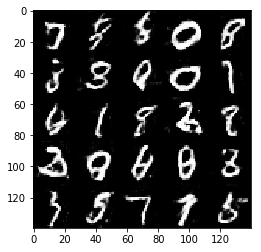

Epoch 2/2... Discriminator Loss: 1.2552... Generator Loss: 0.8542
Epoch 2/2... Discriminator Loss: 1.1940... Generator Loss: 1.6837
Epoch 2/2... Discriminator Loss: 1.6358... Generator Loss: 0.6239
Epoch 2/2... Discriminator Loss: 1.3600... Generator Loss: 0.8030
Epoch 2/2... Discriminator Loss: 1.3123... Generator Loss: 1.5404
Epoch 2/2... Discriminator Loss: 1.2999... Generator Loss: 1.8836
Epoch 2/2... Discriminator Loss: 1.2027... Generator Loss: 1.4042
Epoch 2/2... Discriminator Loss: 1.4969... Generator Loss: 0.9524
Epoch 2/2... Discriminator Loss: 1.1620... Generator Loss: 1.3759
Epoch 2/2... Discriminator Loss: 1.3561... Generator Loss: 0.9274


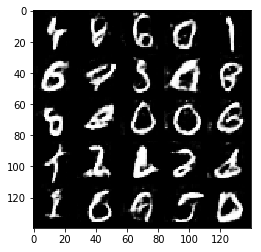

Epoch 2/2... Discriminator Loss: 1.2899... Generator Loss: 0.6688
Epoch 2/2... Discriminator Loss: 1.3459... Generator Loss: 1.0236
Epoch 2/2... Discriminator Loss: 1.5858... Generator Loss: 0.6152
Epoch 2/2... Discriminator Loss: 1.3109... Generator Loss: 1.4645
Epoch 2/2... Discriminator Loss: 1.2464... Generator Loss: 1.3297


In [24]:
batch_size = 32
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/1... Discriminator Loss: 2.2544... Generator Loss: 0.2175
Epoch 1/1... Discriminator Loss: 1.9731... Generator Loss: 0.3297
Epoch 1/1... Discriminator Loss: 1.6963... Generator Loss: 0.4469
Epoch 1/1... Discriminator Loss: 1.5980... Generator Loss: 0.6801
Epoch 1/1... Discriminator Loss: 1.3626... Generator Loss: 0.8026
Epoch 1/1... Discriminator Loss: 1.3652... Generator Loss: 0.7548
Epoch 1/1... Discriminator Loss: 1.7441... Generator Loss: 0.6451
Epoch 1/1... Discriminator Loss: 1.1692... Generator Loss: 0.9531
Epoch 1/1... Discriminator Loss: 1.3246... Generator Loss: 1.0231
Epoch 1/1... Discriminator Loss: 1.3511... Generator Loss: 1.0271


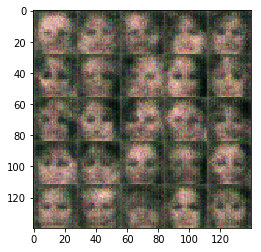

Epoch 1/1... Discriminator Loss: 1.2556... Generator Loss: 1.0314
Epoch 1/1... Discriminator Loss: 1.2781... Generator Loss: 0.7840
Epoch 1/1... Discriminator Loss: 1.5458... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.2420... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.0853... Generator Loss: 1.1619
Epoch 1/1... Discriminator Loss: 1.4893... Generator Loss: 0.8724
Epoch 1/1... Discriminator Loss: 1.3308... Generator Loss: 1.0714
Epoch 1/1... Discriminator Loss: 1.4286... Generator Loss: 0.8117
Epoch 1/1... Discriminator Loss: 1.3878... Generator Loss: 0.7523
Epoch 1/1... Discriminator Loss: 1.1088... Generator Loss: 1.0388


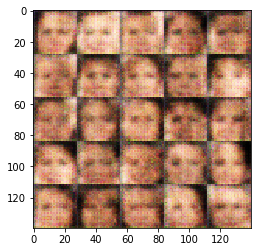

Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.7799
Epoch 1/1... Discriminator Loss: 1.4596... Generator Loss: 0.6467
Epoch 1/1... Discriminator Loss: 1.8064... Generator Loss: 0.6430
Epoch 1/1... Discriminator Loss: 1.2435... Generator Loss: 0.7542
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.8430
Epoch 1/1... Discriminator Loss: 1.6300... Generator Loss: 0.6800
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.8739
Epoch 1/1... Discriminator Loss: 1.6203... Generator Loss: 0.7452
Epoch 1/1... Discriminator Loss: 1.3213... Generator Loss: 0.7245
Epoch 1/1... Discriminator Loss: 1.4728... Generator Loss: 0.6354


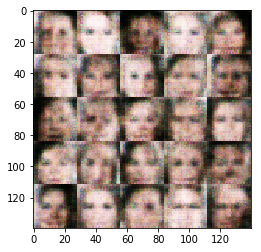

Epoch 1/1... Discriminator Loss: 1.4721... Generator Loss: 0.6722
Epoch 1/1... Discriminator Loss: 1.4946... Generator Loss: 0.5845
Epoch 1/1... Discriminator Loss: 1.4609... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.3884... Generator Loss: 0.8999
Epoch 1/1... Discriminator Loss: 1.1200... Generator Loss: 1.0137
Epoch 1/1... Discriminator Loss: 1.7061... Generator Loss: 0.5888
Epoch 1/1... Discriminator Loss: 1.6778... Generator Loss: 0.6155
Epoch 1/1... Discriminator Loss: 1.7480... Generator Loss: 0.6231
Epoch 1/1... Discriminator Loss: 2.0048... Generator Loss: 0.5988
Epoch 1/1... Discriminator Loss: 1.4577... Generator Loss: 0.7880


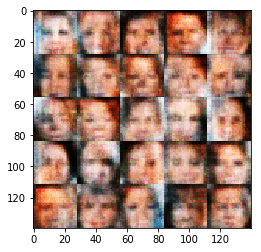

Epoch 1/1... Discriminator Loss: 1.6650... Generator Loss: 0.4782
Epoch 1/1... Discriminator Loss: 1.5444... Generator Loss: 0.8224
Epoch 1/1... Discriminator Loss: 1.4541... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.4510... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.5928... Generator Loss: 0.6670
Epoch 1/1... Discriminator Loss: 1.4568... Generator Loss: 0.6229
Epoch 1/1... Discriminator Loss: 1.5649... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.5783... Generator Loss: 0.6452
Epoch 1/1... Discriminator Loss: 1.5444... Generator Loss: 0.7100
Epoch 1/1... Discriminator Loss: 1.6357... Generator Loss: 0.5351


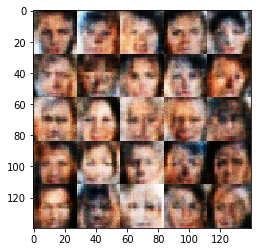

Epoch 1/1... Discriminator Loss: 1.4114... Generator Loss: 0.8515
Epoch 1/1... Discriminator Loss: 1.5680... Generator Loss: 0.6724
Epoch 1/1... Discriminator Loss: 1.4292... Generator Loss: 0.6654
Epoch 1/1... Discriminator Loss: 1.3731... Generator Loss: 0.7744
Epoch 1/1... Discriminator Loss: 1.6718... Generator Loss: 0.6370
Epoch 1/1... Discriminator Loss: 1.4774... Generator Loss: 0.6766
Epoch 1/1... Discriminator Loss: 1.4797... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 1.5368... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.4904... Generator Loss: 0.6601
Epoch 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.8075


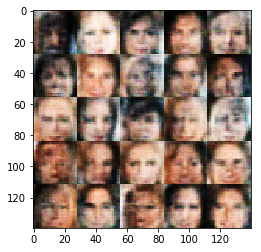

Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 0.7901
Epoch 1/1... Discriminator Loss: 1.5438... Generator Loss: 0.7267
Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.4252... Generator Loss: 0.6079
Epoch 1/1... Discriminator Loss: 1.3692... Generator Loss: 0.7903
Epoch 1/1... Discriminator Loss: 1.4852... Generator Loss: 0.6380
Epoch 1/1... Discriminator Loss: 1.3703... Generator Loss: 0.8200
Epoch 1/1... Discriminator Loss: 1.3884... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.4547... Generator Loss: 0.7601
Epoch 1/1... Discriminator Loss: 1.4569... Generator Loss: 0.7399


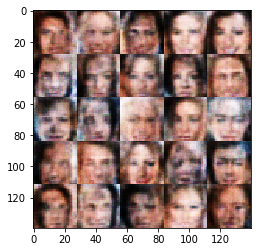

Epoch 1/1... Discriminator Loss: 1.5068... Generator Loss: 0.7490
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.7800
Epoch 1/1... Discriminator Loss: 1.4865... Generator Loss: 0.7364
Epoch 1/1... Discriminator Loss: 1.4581... Generator Loss: 0.8767
Epoch 1/1... Discriminator Loss: 1.4784... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.2735... Generator Loss: 0.8007
Epoch 1/1... Discriminator Loss: 1.3298... Generator Loss: 0.7415
Epoch 1/1... Discriminator Loss: 1.4163... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.4371... Generator Loss: 0.7837
Epoch 1/1... Discriminator Loss: 1.4980... Generator Loss: 0.7704


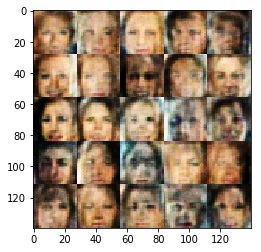

Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 0.9428
Epoch 1/1... Discriminator Loss: 1.5051... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.4342... Generator Loss: 0.7372
Epoch 1/1... Discriminator Loss: 1.4871... Generator Loss: 0.7914
Epoch 1/1... Discriminator Loss: 1.6131... Generator Loss: 0.6216
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.7645
Epoch 1/1... Discriminator Loss: 1.5411... Generator Loss: 0.6626
Epoch 1/1... Discriminator Loss: 1.4443... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.4607... Generator Loss: 0.6159
Epoch 1/1... Discriminator Loss: 1.3815... Generator Loss: 0.6535


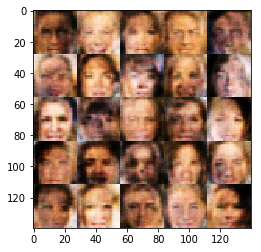

Epoch 1/1... Discriminator Loss: 1.4075... Generator Loss: 0.6495
Epoch 1/1... Discriminator Loss: 1.7463... Generator Loss: 0.5280
Epoch 1/1... Discriminator Loss: 1.4081... Generator Loss: 0.6594
Epoch 1/1... Discriminator Loss: 1.3505... Generator Loss: 0.9675
Epoch 1/1... Discriminator Loss: 1.3908... Generator Loss: 0.7029
Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.7868
Epoch 1/1... Discriminator Loss: 1.5598... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.4687... Generator Loss: 0.7734
Epoch 1/1... Discriminator Loss: 1.4140... Generator Loss: 0.7037
Epoch 1/1... Discriminator Loss: 1.5347... Generator Loss: 0.6803


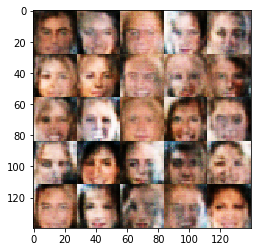

Epoch 1/1... Discriminator Loss: 1.4764... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 1.6270... Generator Loss: 0.4891
Epoch 1/1... Discriminator Loss: 1.6905... Generator Loss: 0.5221
Epoch 1/1... Discriminator Loss: 1.5137... Generator Loss: 0.6040
Epoch 1/1... Discriminator Loss: 1.6105... Generator Loss: 0.6071
Epoch 1/1... Discriminator Loss: 1.5391... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 1.4942... Generator Loss: 0.7841
Epoch 1/1... Discriminator Loss: 1.4811... Generator Loss: 0.6290
Epoch 1/1... Discriminator Loss: 1.7309... Generator Loss: 0.5805
Epoch 1/1... Discriminator Loss: 1.5978... Generator Loss: 0.6612


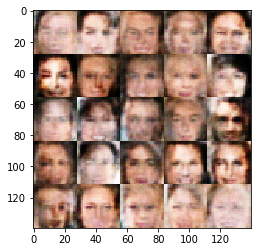

Epoch 1/1... Discriminator Loss: 1.7311... Generator Loss: 0.5898
Epoch 1/1... Discriminator Loss: 1.5751... Generator Loss: 0.6654
Epoch 1/1... Discriminator Loss: 1.7592... Generator Loss: 0.5763
Epoch 1/1... Discriminator Loss: 1.4661... Generator Loss: 0.6877
Epoch 1/1... Discriminator Loss: 1.4008... Generator Loss: 0.7160
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 1.5724... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.7130... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.5412... Generator Loss: 0.6929
Epoch 1/1... Discriminator Loss: 1.5047... Generator Loss: 0.6046


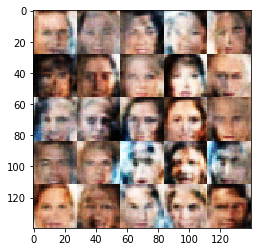

Epoch 1/1... Discriminator Loss: 1.5183... Generator Loss: 0.7398
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.7153
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.6142
Epoch 1/1... Discriminator Loss: 1.8270... Generator Loss: 0.5657
Epoch 1/1... Discriminator Loss: 1.4632... Generator Loss: 0.7415
Epoch 1/1... Discriminator Loss: 1.6112... Generator Loss: 0.7046
Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.7820
Epoch 1/1... Discriminator Loss: 1.5712... Generator Loss: 0.7317
Epoch 1/1... Discriminator Loss: 1.8877... Generator Loss: 0.5546
Epoch 1/1... Discriminator Loss: 1.6097... Generator Loss: 0.6416


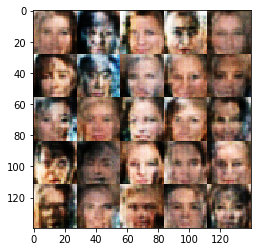

Epoch 1/1... Discriminator Loss: 1.4277... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.5727... Generator Loss: 0.6611
Epoch 1/1... Discriminator Loss: 1.6061... Generator Loss: 0.5867
Epoch 1/1... Discriminator Loss: 1.4950... Generator Loss: 0.6452
Epoch 1/1... Discriminator Loss: 1.4844... Generator Loss: 0.6874
Epoch 1/1... Discriminator Loss: 1.4360... Generator Loss: 0.8178
Epoch 1/1... Discriminator Loss: 1.4805... Generator Loss: 0.8158
Epoch 1/1... Discriminator Loss: 1.4516... Generator Loss: 0.7471
Epoch 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.7652
Epoch 1/1... Discriminator Loss: 1.4092... Generator Loss: 0.7329


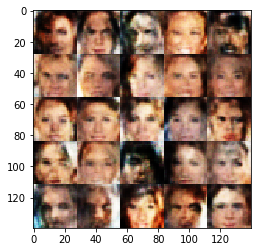

Epoch 1/1... Discriminator Loss: 1.5568... Generator Loss: 0.6894
Epoch 1/1... Discriminator Loss: 1.4338... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 1.2978... Generator Loss: 0.8081
Epoch 1/1... Discriminator Loss: 1.4098... Generator Loss: 0.6860
Epoch 1/1... Discriminator Loss: 1.5394... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.7176
Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.7251
Epoch 1/1... Discriminator Loss: 1.5400... Generator Loss: 0.7071
Epoch 1/1... Discriminator Loss: 1.5031... Generator Loss: 0.7140
Epoch 1/1... Discriminator Loss: 1.6000... Generator Loss: 0.6212


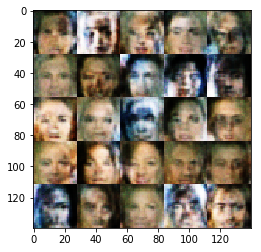

Epoch 1/1... Discriminator Loss: 1.4132... Generator Loss: 0.7850
Epoch 1/1... Discriminator Loss: 1.5574... Generator Loss: 0.7714
Epoch 1/1... Discriminator Loss: 1.4425... Generator Loss: 0.6830
Epoch 1/1... Discriminator Loss: 1.4487... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 0.7823
Epoch 1/1... Discriminator Loss: 1.5016... Generator Loss: 0.6871
Epoch 1/1... Discriminator Loss: 1.4504... Generator Loss: 0.7412
Epoch 1/1... Discriminator Loss: 1.3603... Generator Loss: 0.7845
Epoch 1/1... Discriminator Loss: 1.5400... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.5790... Generator Loss: 0.6730


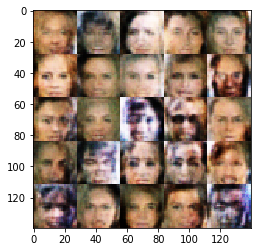

Epoch 1/1... Discriminator Loss: 1.5854... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 1.4565... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.5045... Generator Loss: 0.7125
Epoch 1/1... Discriminator Loss: 1.3913... Generator Loss: 0.7703
Epoch 1/1... Discriminator Loss: 1.5012... Generator Loss: 0.7565
Epoch 1/1... Discriminator Loss: 1.4510... Generator Loss: 0.6500
Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 0.7757
Epoch 1/1... Discriminator Loss: 1.5066... Generator Loss: 0.7008
Epoch 1/1... Discriminator Loss: 1.3727... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.4317... Generator Loss: 0.6819


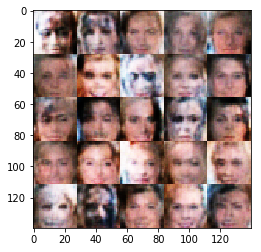

Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.6441
Epoch 1/1... Discriminator Loss: 1.4568... Generator Loss: 0.7149
Epoch 1/1... Discriminator Loss: 1.5933... Generator Loss: 0.6372
Epoch 1/1... Discriminator Loss: 1.4786... Generator Loss: 0.8070
Epoch 1/1... Discriminator Loss: 1.4754... Generator Loss: 0.7287
Epoch 1/1... Discriminator Loss: 1.4563... Generator Loss: 0.7532
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.8209
Epoch 1/1... Discriminator Loss: 1.5251... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.5227... Generator Loss: 0.8280
Epoch 1/1... Discriminator Loss: 1.4267... Generator Loss: 0.7179


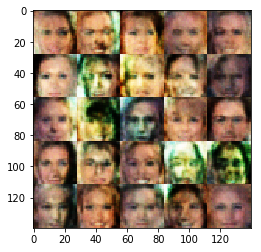

Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.7941
Epoch 1/1... Discriminator Loss: 1.4947... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.5371... Generator Loss: 0.6215
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.7786
Epoch 1/1... Discriminator Loss: 1.3763... Generator Loss: 0.7923
Epoch 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.7916
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.6873
Epoch 1/1... Discriminator Loss: 1.3758... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.4150... Generator Loss: 0.7801
Epoch 1/1... Discriminator Loss: 1.3916... Generator Loss: 0.7479


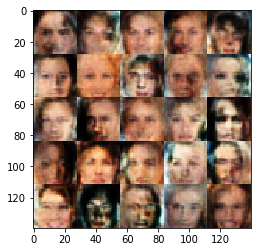

Epoch 1/1... Discriminator Loss: 1.6627... Generator Loss: 0.6519
Epoch 1/1... Discriminator Loss: 1.4695... Generator Loss: 0.7282
Epoch 1/1... Discriminator Loss: 1.3713... Generator Loss: 0.7441
Epoch 1/1... Discriminator Loss: 1.4514... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.2876... Generator Loss: 0.7764
Epoch 1/1... Discriminator Loss: 1.4783... Generator Loss: 0.7220
Epoch 1/1... Discriminator Loss: 1.6175... Generator Loss: 0.7107
Epoch 1/1... Discriminator Loss: 1.4610... Generator Loss: 0.8155
Epoch 1/1... Discriminator Loss: 1.4578... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.7287


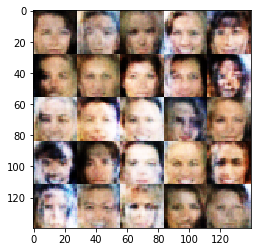

Epoch 1/1... Discriminator Loss: 1.4127... Generator Loss: 0.8577
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.7148
Epoch 1/1... Discriminator Loss: 1.6703... Generator Loss: 0.5620
Epoch 1/1... Discriminator Loss: 1.3402... Generator Loss: 0.7313
Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.6791
Epoch 1/1... Discriminator Loss: 1.4869... Generator Loss: 0.6553
Epoch 1/1... Discriminator Loss: 1.4486... Generator Loss: 0.7497
Epoch 1/1... Discriminator Loss: 1.6004... Generator Loss: 0.6258
Epoch 1/1... Discriminator Loss: 1.5249... Generator Loss: 0.7258
Epoch 1/1... Discriminator Loss: 1.5155... Generator Loss: 0.6605


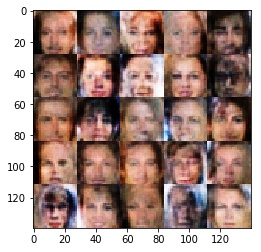

Epoch 1/1... Discriminator Loss: 1.5111... Generator Loss: 0.6957
Epoch 1/1... Discriminator Loss: 1.5773... Generator Loss: 0.5899
Epoch 1/1... Discriminator Loss: 1.5561... Generator Loss: 0.6818
Epoch 1/1... Discriminator Loss: 1.5833... Generator Loss: 0.6279
Epoch 1/1... Discriminator Loss: 1.4097... Generator Loss: 0.8114
Epoch 1/1... Discriminator Loss: 1.4613... Generator Loss: 0.8228
Epoch 1/1... Discriminator Loss: 1.7347... Generator Loss: 0.5585
Epoch 1/1... Discriminator Loss: 1.5231... Generator Loss: 0.6690
Epoch 1/1... Discriminator Loss: 1.4660... Generator Loss: 0.6544
Epoch 1/1... Discriminator Loss: 1.4619... Generator Loss: 0.7055


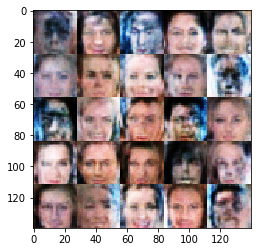

Epoch 1/1... Discriminator Loss: 1.4085... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.3431... Generator Loss: 0.7668
Epoch 1/1... Discriminator Loss: 1.4383... Generator Loss: 0.7859
Epoch 1/1... Discriminator Loss: 1.4183... Generator Loss: 0.7449
Epoch 1/1... Discriminator Loss: 1.3958... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.4123... Generator Loss: 0.8184
Epoch 1/1... Discriminator Loss: 1.4909... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 1.4622... Generator Loss: 0.7542
Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.8435
Epoch 1/1... Discriminator Loss: 1.4274... Generator Loss: 0.7058


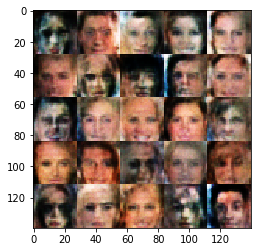

Epoch 1/1... Discriminator Loss: 1.4771... Generator Loss: 0.6813
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.8411
Epoch 1/1... Discriminator Loss: 1.4116... Generator Loss: 0.7561
Epoch 1/1... Discriminator Loss: 1.5718... Generator Loss: 0.6644
Epoch 1/1... Discriminator Loss: 1.4520... Generator Loss: 0.7354
Epoch 1/1... Discriminator Loss: 1.4077... Generator Loss: 0.7977
Epoch 1/1... Discriminator Loss: 1.5106... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.5291... Generator Loss: 0.6768
Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.8406
Epoch 1/1... Discriminator Loss: 1.4941... Generator Loss: 0.6482


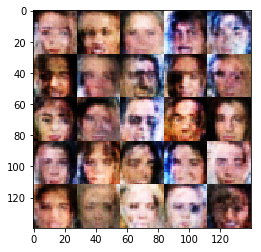

Epoch 1/1... Discriminator Loss: 1.4586... Generator Loss: 0.8411
Epoch 1/1... Discriminator Loss: 1.5292... Generator Loss: 0.7298
Epoch 1/1... Discriminator Loss: 1.4352... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.5395... Generator Loss: 0.6928
Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 1.5302... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.4345... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 1.2908... Generator Loss: 0.8252
Epoch 1/1... Discriminator Loss: 1.3302... Generator Loss: 0.7544
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.7791


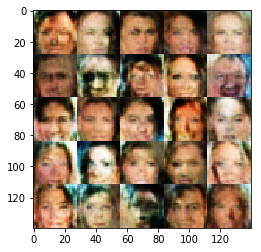

Epoch 1/1... Discriminator Loss: 1.4878... Generator Loss: 0.7441
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 1.4369... Generator Loss: 0.7905
Epoch 1/1... Discriminator Loss: 1.4293... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 0.6622
Epoch 1/1... Discriminator Loss: 1.3880... Generator Loss: 0.7730
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.8315
Epoch 1/1... Discriminator Loss: 1.6406... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 1.5319... Generator Loss: 0.7183
Epoch 1/1... Discriminator Loss: 1.3597... Generator Loss: 0.8028


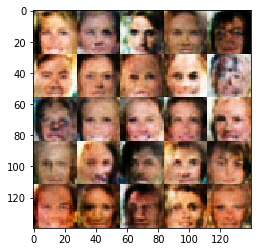

Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 1.5271... Generator Loss: 0.7203
Epoch 1/1... Discriminator Loss: 1.4867... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.4055... Generator Loss: 0.7075
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.7788
Epoch 1/1... Discriminator Loss: 1.4402... Generator Loss: 0.7802
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.8271
Epoch 1/1... Discriminator Loss: 1.4396... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.3075... Generator Loss: 0.8085
Epoch 1/1... Discriminator Loss: 1.3133... Generator Loss: 0.8704


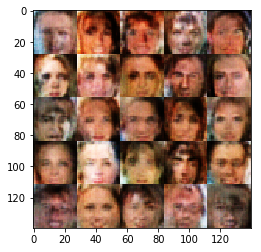

Epoch 1/1... Discriminator Loss: 1.4003... Generator Loss: 0.7581
Epoch 1/1... Discriminator Loss: 1.4376... Generator Loss: 0.8103
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.7982
Epoch 1/1... Discriminator Loss: 1.3429... Generator Loss: 0.7783
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.6752
Epoch 1/1... Discriminator Loss: 1.4626... Generator Loss: 0.7482
Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 1.5395... Generator Loss: 0.6683
Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.7926
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.7266


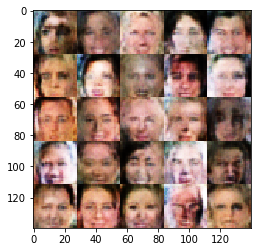

Epoch 1/1... Discriminator Loss: 1.3817... Generator Loss: 0.8519
Epoch 1/1... Discriminator Loss: 1.4990... Generator Loss: 0.7054
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.7160
Epoch 1/1... Discriminator Loss: 1.3596... Generator Loss: 0.7491
Epoch 1/1... Discriminator Loss: 1.4070... Generator Loss: 0.8277
Epoch 1/1... Discriminator Loss: 1.4573... Generator Loss: 0.7440
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.7632
Epoch 1/1... Discriminator Loss: 1.4565... Generator Loss: 0.7986
Epoch 1/1... Discriminator Loss: 1.4563... Generator Loss: 0.7774
Epoch 1/1... Discriminator Loss: 1.4628... Generator Loss: 0.7128


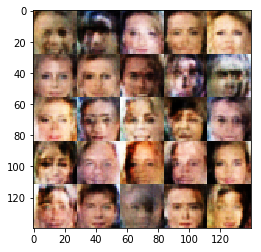

Epoch 1/1... Discriminator Loss: 1.3977... Generator Loss: 0.7925
Epoch 1/1... Discriminator Loss: 1.4326... Generator Loss: 0.7429
Epoch 1/1... Discriminator Loss: 1.5500... Generator Loss: 0.6795
Epoch 1/1... Discriminator Loss: 1.3793... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.7755
Epoch 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.8015
Epoch 1/1... Discriminator Loss: 1.4638... Generator Loss: 0.7686
Epoch 1/1... Discriminator Loss: 1.5132... Generator Loss: 0.6856
Epoch 1/1... Discriminator Loss: 1.5473... Generator Loss: 0.7104
Epoch 1/1... Discriminator Loss: 1.5066... Generator Loss: 0.6815


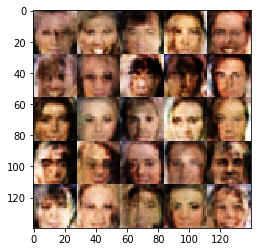

Epoch 1/1... Discriminator Loss: 1.5290... Generator Loss: 0.6537
Epoch 1/1... Discriminator Loss: 1.3145... Generator Loss: 0.7924
Epoch 1/1... Discriminator Loss: 1.4635... Generator Loss: 0.8203
Epoch 1/1... Discriminator Loss: 1.5148... Generator Loss: 0.7815
Epoch 1/1... Discriminator Loss: 1.6037... Generator Loss: 0.6508
Epoch 1/1... Discriminator Loss: 1.5043... Generator Loss: 0.7119
Epoch 1/1... Discriminator Loss: 1.3281... Generator Loss: 0.7428
Epoch 1/1... Discriminator Loss: 1.3572... Generator Loss: 0.8150
Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 0.8354
Epoch 1/1... Discriminator Loss: 1.4364... Generator Loss: 0.6854


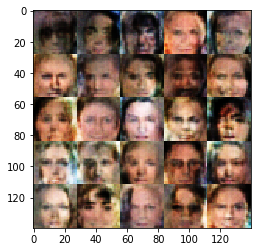

Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.7213
Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.7831
Epoch 1/1... Discriminator Loss: 1.4592... Generator Loss: 0.7080
Epoch 1/1... Discriminator Loss: 1.4301... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 1.3066... Generator Loss: 0.7998
Epoch 1/1... Discriminator Loss: 1.5794... Generator Loss: 0.7007
Epoch 1/1... Discriminator Loss: 1.5149... Generator Loss: 0.7485
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.8106
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.6989
Epoch 1/1... Discriminator Loss: 1.3707... Generator Loss: 0.7972


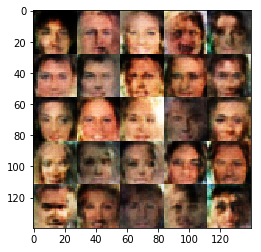

Epoch 1/1... Discriminator Loss: 1.4447... Generator Loss: 0.6797
Epoch 1/1... Discriminator Loss: 1.4546... Generator Loss: 0.6894
Epoch 1/1... Discriminator Loss: 1.4001... Generator Loss: 0.7128
Epoch 1/1... Discriminator Loss: 1.5201... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.4981... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.7090
Epoch 1/1... Discriminator Loss: 1.4527... Generator Loss: 0.6627
Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.7813
Epoch 1/1... Discriminator Loss: 1.3723... Generator Loss: 0.7252
Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.7956


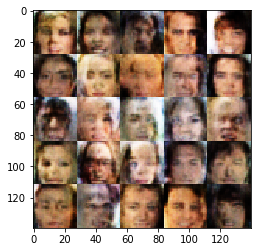

Epoch 1/1... Discriminator Loss: 1.4475... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.3489... Generator Loss: 0.7467
Epoch 1/1... Discriminator Loss: 1.4684... Generator Loss: 0.8078
Epoch 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.7429
Epoch 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.7196
Epoch 1/1... Discriminator Loss: 1.5491... Generator Loss: 0.7335
Epoch 1/1... Discriminator Loss: 1.4486... Generator Loss: 0.7832
Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.7708
Epoch 1/1... Discriminator Loss: 1.4549... Generator Loss: 0.6641
Epoch 1/1... Discriminator Loss: 1.3148... Generator Loss: 0.7661


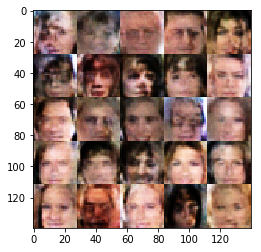

Epoch 1/1... Discriminator Loss: 1.4417... Generator Loss: 0.7501
Epoch 1/1... Discriminator Loss: 1.4698... Generator Loss: 0.7366
Epoch 1/1... Discriminator Loss: 1.3901... Generator Loss: 0.7479
Epoch 1/1... Discriminator Loss: 1.5175... Generator Loss: 0.7080
Epoch 1/1... Discriminator Loss: 1.4004... Generator Loss: 0.7214
Epoch 1/1... Discriminator Loss: 1.4529... Generator Loss: 0.6605
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.4043... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 1.5238... Generator Loss: 0.7602
Epoch 1/1... Discriminator Loss: 1.4333... Generator Loss: 0.7355


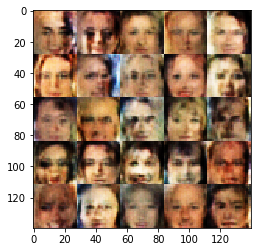

Epoch 1/1... Discriminator Loss: 1.3759... Generator Loss: 0.7691
Epoch 1/1... Discriminator Loss: 1.3694... Generator Loss: 0.7632
Epoch 1/1... Discriminator Loss: 1.4093... Generator Loss: 0.7789
Epoch 1/1... Discriminator Loss: 1.5331... Generator Loss: 0.6575
Epoch 1/1... Discriminator Loss: 1.3758... Generator Loss: 0.6625
Epoch 1/1... Discriminator Loss: 1.4891... Generator Loss: 0.7671
Epoch 1/1... Discriminator Loss: 1.6188... Generator Loss: 0.6270
Epoch 1/1... Discriminator Loss: 1.3782... Generator Loss: 0.6887
Epoch 1/1... Discriminator Loss: 1.3888... Generator Loss: 0.7706
Epoch 1/1... Discriminator Loss: 1.2945... Generator Loss: 0.7265


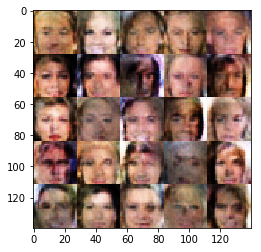

Epoch 1/1... Discriminator Loss: 1.3885... Generator Loss: 0.7407
Epoch 1/1... Discriminator Loss: 1.2583... Generator Loss: 0.8358
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.8320
Epoch 1/1... Discriminator Loss: 1.4748... Generator Loss: 0.6916
Epoch 1/1... Discriminator Loss: 1.3910... Generator Loss: 0.7367
Epoch 1/1... Discriminator Loss: 1.4651... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.3727... Generator Loss: 0.7476
Epoch 1/1... Discriminator Loss: 1.5231... Generator Loss: 0.6818
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.7130
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.7461


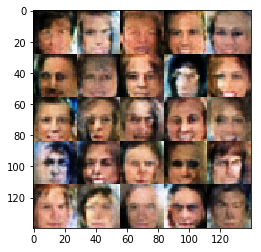

Epoch 1/1... Discriminator Loss: 1.2968... Generator Loss: 0.7965
Epoch 1/1... Discriminator Loss: 1.4689... Generator Loss: 0.7175
Epoch 1/1... Discriminator Loss: 1.4094... Generator Loss: 0.6835
Epoch 1/1... Discriminator Loss: 1.5124... Generator Loss: 0.7301
Epoch 1/1... Discriminator Loss: 1.3537... Generator Loss: 0.7837
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.7961
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.7347
Epoch 1/1... Discriminator Loss: 1.3057... Generator Loss: 0.7994
Epoch 1/1... Discriminator Loss: 1.4182... Generator Loss: 0.7145
Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.7219


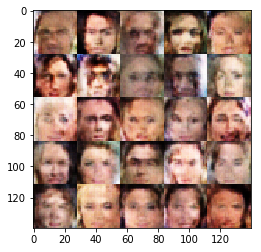

Epoch 1/1... Discriminator Loss: 1.4477... Generator Loss: 0.7540
Epoch 1/1... Discriminator Loss: 1.4657... Generator Loss: 0.6678
Epoch 1/1... Discriminator Loss: 1.4383... Generator Loss: 0.7887
Epoch 1/1... Discriminator Loss: 1.3496... Generator Loss: 0.7721
Epoch 1/1... Discriminator Loss: 1.4263... Generator Loss: 0.7564
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.7499
Epoch 1/1... Discriminator Loss: 1.4162... Generator Loss: 0.7788
Epoch 1/1... Discriminator Loss: 1.4323... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.7729
Epoch 1/1... Discriminator Loss: 1.4895... Generator Loss: 0.7434


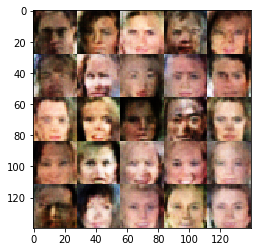

Epoch 1/1... Discriminator Loss: 1.4449... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.2266... Generator Loss: 0.7971
Epoch 1/1... Discriminator Loss: 1.4764... Generator Loss: 0.6769
Epoch 1/1... Discriminator Loss: 1.4016... Generator Loss: 0.7137
Epoch 1/1... Discriminator Loss: 1.3962... Generator Loss: 0.7271
Epoch 1/1... Discriminator Loss: 1.3796... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.8586
Epoch 1/1... Discriminator Loss: 1.4623... Generator Loss: 0.7792
Epoch 1/1... Discriminator Loss: 1.4143... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.8369


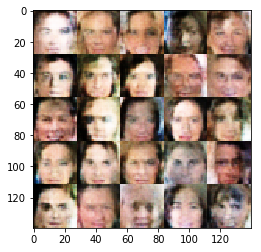

Epoch 1/1... Discriminator Loss: 1.5095... Generator Loss: 0.8205
Epoch 1/1... Discriminator Loss: 1.4138... Generator Loss: 0.7548
Epoch 1/1... Discriminator Loss: 1.3999... Generator Loss: 0.7645
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 0.8142
Epoch 1/1... Discriminator Loss: 1.4006... Generator Loss: 0.7321
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.7615
Epoch 1/1... Discriminator Loss: 1.4292... Generator Loss: 0.8171
Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.7863


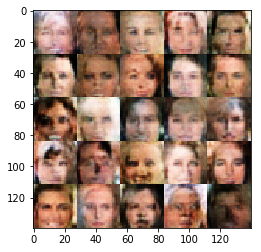

Epoch 1/1... Discriminator Loss: 1.4715... Generator Loss: 0.6889
Epoch 1/1... Discriminator Loss: 1.3603... Generator Loss: 0.8046
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.7571
Epoch 1/1... Discriminator Loss: 1.3200... Generator Loss: 0.7638
Epoch 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.8888
Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.8174
Epoch 1/1... Discriminator Loss: 1.5182... Generator Loss: 0.7814
Epoch 1/1... Discriminator Loss: 1.5352... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.7651
Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.6772


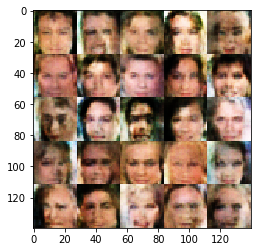

Epoch 1/1... Discriminator Loss: 1.4856... Generator Loss: 0.7488
Epoch 1/1... Discriminator Loss: 1.4660... Generator Loss: 0.8231
Epoch 1/1... Discriminator Loss: 1.4001... Generator Loss: 0.7585
Epoch 1/1... Discriminator Loss: 1.4567... Generator Loss: 0.7604
Epoch 1/1... Discriminator Loss: 1.3905... Generator Loss: 0.7931
Epoch 1/1... Discriminator Loss: 1.4344... Generator Loss: 0.7904
Epoch 1/1... Discriminator Loss: 1.4149... Generator Loss: 0.7732
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.7967
Epoch 1/1... Discriminator Loss: 1.4492... Generator Loss: 0.7113
Epoch 1/1... Discriminator Loss: 1.4699... Generator Loss: 0.7167


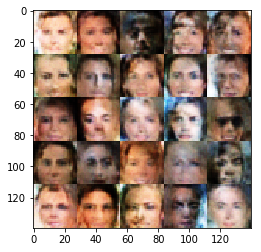

Epoch 1/1... Discriminator Loss: 1.4431... Generator Loss: 0.8213
Epoch 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.8405
Epoch 1/1... Discriminator Loss: 1.3812... Generator Loss: 0.7968
Epoch 1/1... Discriminator Loss: 1.3755... Generator Loss: 0.7165
Epoch 1/1... Discriminator Loss: 1.3826... Generator Loss: 0.7881
Epoch 1/1... Discriminator Loss: 1.4085... Generator Loss: 0.7077
Epoch 1/1... Discriminator Loss: 1.3329... Generator Loss: 0.8543
Epoch 1/1... Discriminator Loss: 1.4229... Generator Loss: 0.7971
Epoch 1/1... Discriminator Loss: 1.5010... Generator Loss: 0.7139
Epoch 1/1... Discriminator Loss: 1.3618... Generator Loss: 0.8523


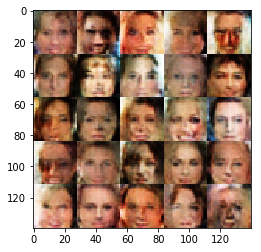

Epoch 1/1... Discriminator Loss: 1.4199... Generator Loss: 0.8261
Epoch 1/1... Discriminator Loss: 1.4154... Generator Loss: 0.7310
Epoch 1/1... Discriminator Loss: 1.4604... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 1.4680... Generator Loss: 0.7581
Epoch 1/1... Discriminator Loss: 1.3709... Generator Loss: 0.8658
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.7513
Epoch 1/1... Discriminator Loss: 1.3478... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.5146... Generator Loss: 0.7322
Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 0.7926
Epoch 1/1... Discriminator Loss: 1.3932... Generator Loss: 0.7310


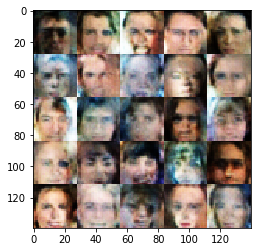

Epoch 1/1... Discriminator Loss: 1.3782... Generator Loss: 0.7832
Epoch 1/1... Discriminator Loss: 1.3811... Generator Loss: 0.8446
Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 0.7966
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 1.3692... Generator Loss: 0.7536
Epoch 1/1... Discriminator Loss: 1.4424... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.4547... Generator Loss: 0.7839
Epoch 1/1... Discriminator Loss: 1.4109... Generator Loss: 0.7499
Epoch 1/1... Discriminator Loss: 1.4046... Generator Loss: 0.8247
Epoch 1/1... Discriminator Loss: 1.3733... Generator Loss: 0.7556


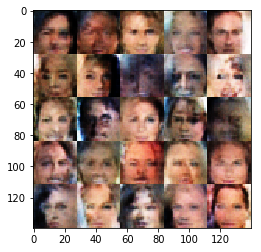

Epoch 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.7202
Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.1771... Generator Loss: 0.9169
Epoch 1/1... Discriminator Loss: 1.4092... Generator Loss: 0.7060
Epoch 1/1... Discriminator Loss: 1.4385... Generator Loss: 0.7734
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.6587
Epoch 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.8252
Epoch 1/1... Discriminator Loss: 1.5483... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.5140... Generator Loss: 0.6622
Epoch 1/1... Discriminator Loss: 1.2284... Generator Loss: 0.8163


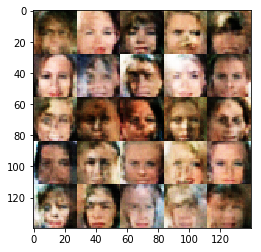

Epoch 1/1... Discriminator Loss: 1.4472... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.3432... Generator Loss: 0.8336
Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 0.7338
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.7769
Epoch 1/1... Discriminator Loss: 1.3557... Generator Loss: 0.7834
Epoch 1/1... Discriminator Loss: 1.4180... Generator Loss: 0.7826
Epoch 1/1... Discriminator Loss: 1.3623... Generator Loss: 0.7572
Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.7488
Epoch 1/1... Discriminator Loss: 1.3583... Generator Loss: 0.8131
Epoch 1/1... Discriminator Loss: 1.4300... Generator Loss: 0.7314


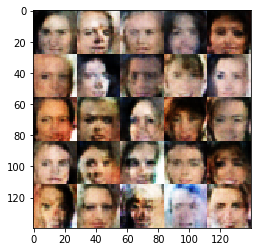

Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.8264
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.7226
Epoch 1/1... Discriminator Loss: 1.4641... Generator Loss: 0.7115
Epoch 1/1... Discriminator Loss: 1.3716... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 1.4562... Generator Loss: 0.7108
Epoch 1/1... Discriminator Loss: 1.3816... Generator Loss: 0.7863
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.7004
Epoch 1/1... Discriminator Loss: 1.4990... Generator Loss: 0.7799
Epoch 1/1... Discriminator Loss: 1.3454... Generator Loss: 0.8422


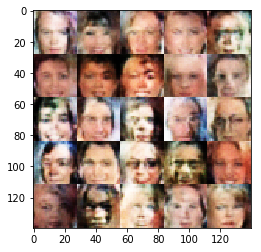

Epoch 1/1... Discriminator Loss: 1.3699... Generator Loss: 0.8066
Epoch 1/1... Discriminator Loss: 1.4365... Generator Loss: 0.7951
Epoch 1/1... Discriminator Loss: 1.4580... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.4680... Generator Loss: 0.7724
Epoch 1/1... Discriminator Loss: 1.3660... Generator Loss: 0.7449
Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 0.8291
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.7935
Epoch 1/1... Discriminator Loss: 1.4584... Generator Loss: 0.7447
Epoch 1/1... Discriminator Loss: 1.2844... Generator Loss: 0.8057
Epoch 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.8518


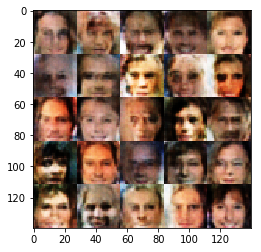

Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.7387
Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 0.7836
Epoch 1/1... Discriminator Loss: 1.3543... Generator Loss: 0.7967
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 0.7157
Epoch 1/1... Discriminator Loss: 1.2926... Generator Loss: 0.7714
Epoch 1/1... Discriminator Loss: 1.3096... Generator Loss: 0.8325
Epoch 1/1... Discriminator Loss: 1.1995... Generator Loss: 0.7759
Epoch 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.7813
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.7613


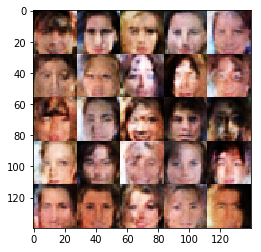

Epoch 1/1... Discriminator Loss: 1.3162... Generator Loss: 0.8101
Epoch 1/1... Discriminator Loss: 1.3787... Generator Loss: 0.7798
Epoch 1/1... Discriminator Loss: 1.3713... Generator Loss: 0.7860
Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 0.8402
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 0.6988
Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.7966
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.7744
Epoch 1/1... Discriminator Loss: 1.4321... Generator Loss: 0.7848
Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.8009
Epoch 1/1... Discriminator Loss: 1.4028... Generator Loss: 0.7447


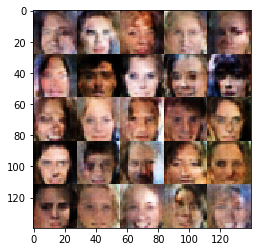

Epoch 1/1... Discriminator Loss: 1.4532... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.4089... Generator Loss: 0.8010
Epoch 1/1... Discriminator Loss: 1.4282... Generator Loss: 0.7768
Epoch 1/1... Discriminator Loss: 1.3112... Generator Loss: 0.7009
Epoch 1/1... Discriminator Loss: 1.3858... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.4196... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 1.3439... Generator Loss: 0.7850
Epoch 1/1... Discriminator Loss: 1.4768... Generator Loss: 0.7120
Epoch 1/1... Discriminator Loss: 1.4913... Generator Loss: 0.6709


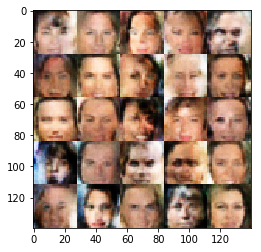

Epoch 1/1... Discriminator Loss: 1.5149... Generator Loss: 0.7369
Epoch 1/1... Discriminator Loss: 1.4138... Generator Loss: 0.7507
Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.7725
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.7774
Epoch 1/1... Discriminator Loss: 1.3814... Generator Loss: 0.7613
Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.7123
Epoch 1/1... Discriminator Loss: 1.3218... Generator Loss: 0.8373
Epoch 1/1... Discriminator Loss: 1.2702... Generator Loss: 0.8204
Epoch 1/1... Discriminator Loss: 1.4321... Generator Loss: 0.7870
Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.7207


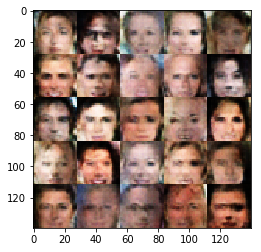

Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.4544... Generator Loss: 0.6230
Epoch 1/1... Discriminator Loss: 1.4524... Generator Loss: 0.6584
Epoch 1/1... Discriminator Loss: 1.3443... Generator Loss: 0.7858
Epoch 1/1... Discriminator Loss: 1.4409... Generator Loss: 0.7683
Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.7493
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.3671... Generator Loss: 0.7798
Epoch 1/1... Discriminator Loss: 1.4245... Generator Loss: 0.6296
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.7042


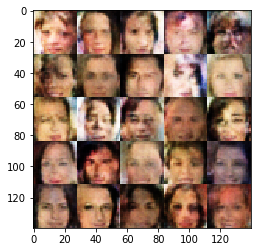

Epoch 1/1... Discriminator Loss: 1.3457... Generator Loss: 0.8515
Epoch 1/1... Discriminator Loss: 1.4410... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.5252... Generator Loss: 0.7555
Epoch 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.7750
Epoch 1/1... Discriminator Loss: 1.3707... Generator Loss: 0.7538
Epoch 1/1... Discriminator Loss: 1.3120... Generator Loss: 0.8078
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.7907
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.7351
Epoch 1/1... Discriminator Loss: 1.4539... Generator Loss: 0.7250
Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.7909


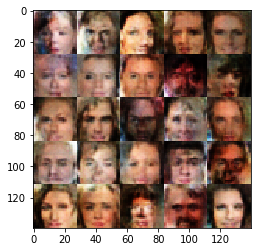

Epoch 1/1... Discriminator Loss: 1.4193... Generator Loss: 0.7426
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 1.2268... Generator Loss: 0.8617
Epoch 1/1... Discriminator Loss: 1.3153... Generator Loss: 0.8146
Epoch 1/1... Discriminator Loss: 1.4271... Generator Loss: 0.6722
Epoch 1/1... Discriminator Loss: 1.5268... Generator Loss: 0.6986
Epoch 1/1... Discriminator Loss: 1.4117... Generator Loss: 0.7776
Epoch 1/1... Discriminator Loss: 1.4155... Generator Loss: 0.7937
Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.7194
Epoch 1/1... Discriminator Loss: 1.3975... Generator Loss: 0.6818


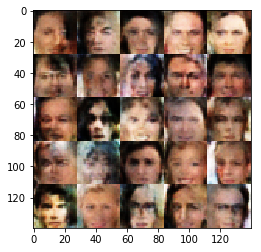

Epoch 1/1... Discriminator Loss: 1.5046... Generator Loss: 0.6605
Epoch 1/1... Discriminator Loss: 1.3919... Generator Loss: 0.7228
Epoch 1/1... Discriminator Loss: 1.3154... Generator Loss: 0.8140
Epoch 1/1... Discriminator Loss: 1.2443... Generator Loss: 0.7989
Epoch 1/1... Discriminator Loss: 1.3952... Generator Loss: 0.7922
Epoch 1/1... Discriminator Loss: 1.5302... Generator Loss: 0.6559
Epoch 1/1... Discriminator Loss: 1.3398... Generator Loss: 0.7578
Epoch 1/1... Discriminator Loss: 1.4898... Generator Loss: 0.7273
Epoch 1/1... Discriminator Loss: 1.4579... Generator Loss: 0.6932
Epoch 1/1... Discriminator Loss: 1.3280... Generator Loss: 0.7759


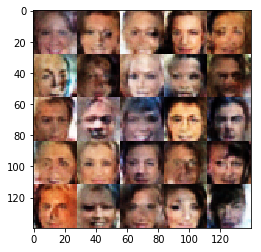

Epoch 1/1... Discriminator Loss: 1.4170... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.6958
Epoch 1/1... Discriminator Loss: 1.4950... Generator Loss: 0.8538
Epoch 1/1... Discriminator Loss: 1.5114... Generator Loss: 0.6905
Epoch 1/1... Discriminator Loss: 1.3610... Generator Loss: 0.7739
Epoch 1/1... Discriminator Loss: 1.4004... Generator Loss: 0.7501
Epoch 1/1... Discriminator Loss: 1.2945... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.7475
Epoch 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.8074
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.7893


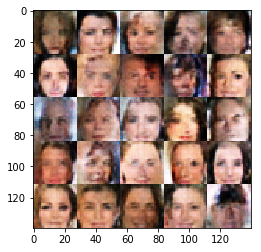

Epoch 1/1... Discriminator Loss: 1.3420... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.8193
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.7540
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 0.8067
Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.4312... Generator Loss: 0.8314
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.6175
Epoch 1/1... Discriminator Loss: 1.3448... Generator Loss: 0.7039
Epoch 1/1... Discriminator Loss: 1.4793... Generator Loss: 0.6725


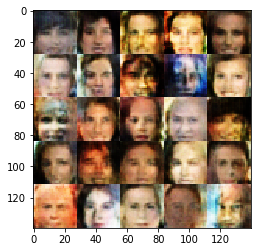

Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.9067
Epoch 1/1... Discriminator Loss: 1.5029... Generator Loss: 0.7280
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.8117
Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.7093
Epoch 1/1... Discriminator Loss: 1.5119... Generator Loss: 0.7930
Epoch 1/1... Discriminator Loss: 1.4313... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.4424... Generator Loss: 0.7821
Epoch 1/1... Discriminator Loss: 1.3373... Generator Loss: 0.7691
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.7322
Epoch 1/1... Discriminator Loss: 1.3432... Generator Loss: 0.9057


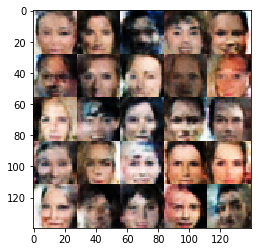

Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.7037
Epoch 1/1... Discriminator Loss: 1.4435... Generator Loss: 0.7892
Epoch 1/1... Discriminator Loss: 1.3266... Generator Loss: 0.7097
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.8510
Epoch 1/1... Discriminator Loss: 1.4461... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.2885... Generator Loss: 0.8032
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 1.3610... Generator Loss: 0.7654
Epoch 1/1... Discriminator Loss: 1.3615... Generator Loss: 0.7632


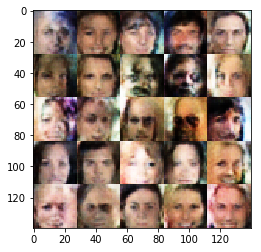

Epoch 1/1... Discriminator Loss: 1.4812... Generator Loss: 0.8353
Epoch 1/1... Discriminator Loss: 1.3708... Generator Loss: 0.8024
Epoch 1/1... Discriminator Loss: 1.3648... Generator Loss: 0.9135
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.7426
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.7273
Epoch 1/1... Discriminator Loss: 1.2762... Generator Loss: 0.9126
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 0.8125
Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.7749
Epoch 1/1... Discriminator Loss: 1.2770... Generator Loss: 0.9695
Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.7150


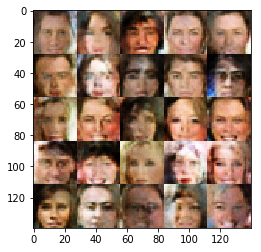

Epoch 1/1... Discriminator Loss: 1.3691... Generator Loss: 0.7840
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 0.8271
Epoch 1/1... Discriminator Loss: 1.3455... Generator Loss: 0.7178
Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.8326
Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 0.8698
Epoch 1/1... Discriminator Loss: 1.4170... Generator Loss: 0.7308
Epoch 1/1... Discriminator Loss: 1.2594... Generator Loss: 0.7963
Epoch 1/1... Discriminator Loss: 1.4944... Generator Loss: 0.7271
Epoch 1/1... Discriminator Loss: 1.4002... Generator Loss: 0.8357
Epoch 1/1... Discriminator Loss: 1.3389... Generator Loss: 0.8271


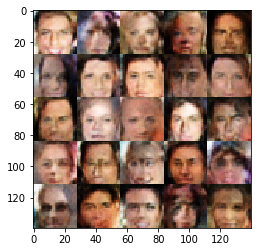

Epoch 1/1... Discriminator Loss: 1.3686... Generator Loss: 0.6819
Epoch 1/1... Discriminator Loss: 1.2397... Generator Loss: 0.8850
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.7921
Epoch 1/1... Discriminator Loss: 1.3838... Generator Loss: 0.7314
Epoch 1/1... Discriminator Loss: 1.4051... Generator Loss: 0.6841
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.8196
Epoch 1/1... Discriminator Loss: 1.4362... Generator Loss: 0.7314
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.8080
Epoch 1/1... Discriminator Loss: 1.3425... Generator Loss: 0.8054
Epoch 1/1... Discriminator Loss: 1.3094... Generator Loss: 0.7964


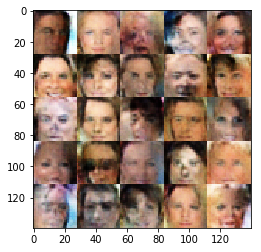

Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 0.7308
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 1.4575... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.6327
Epoch 1/1... Discriminator Loss: 1.3528... Generator Loss: 0.7294
Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.7765
Epoch 1/1... Discriminator Loss: 1.4193... Generator Loss: 0.7847
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.8473
Epoch 1/1... Discriminator Loss: 1.5159... Generator Loss: 0.6977


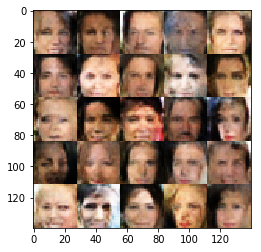

Epoch 1/1... Discriminator Loss: 1.4100... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.4679... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.7732
Epoch 1/1... Discriminator Loss: 1.2491... Generator Loss: 0.8045
Epoch 1/1... Discriminator Loss: 1.4251... Generator Loss: 0.7369
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.7759
Epoch 1/1... Discriminator Loss: 1.2769... Generator Loss: 0.7457
Epoch 1/1... Discriminator Loss: 1.2261... Generator Loss: 0.8780
Epoch 1/1... Discriminator Loss: 1.3305... Generator Loss: 0.8050
Epoch 1/1... Discriminator Loss: 1.5269... Generator Loss: 0.6746


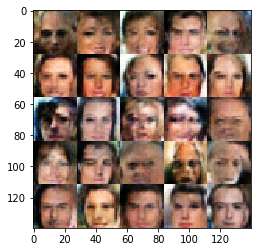

Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.7640
Epoch 1/1... Discriminator Loss: 1.6352... Generator Loss: 0.6683
Epoch 1/1... Discriminator Loss: 1.2765... Generator Loss: 0.7020
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.8057
Epoch 1/1... Discriminator Loss: 1.3885... Generator Loss: 0.7693
Epoch 1/1... Discriminator Loss: 1.3377... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 1.2112... Generator Loss: 0.8443
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.8056
Epoch 1/1... Discriminator Loss: 1.3800... Generator Loss: 0.7550
Epoch 1/1... Discriminator Loss: 1.3264... Generator Loss: 0.7988


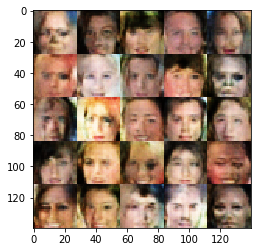

Epoch 1/1... Discriminator Loss: 1.4881... Generator Loss: 0.7878
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.7948
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.7803
Epoch 1/1... Discriminator Loss: 1.3228... Generator Loss: 0.8698
Epoch 1/1... Discriminator Loss: 1.3441... Generator Loss: 0.9604
Epoch 1/1... Discriminator Loss: 1.6977... Generator Loss: 0.6048
Epoch 1/1... Discriminator Loss: 1.4599... Generator Loss: 0.7220
Epoch 1/1... Discriminator Loss: 1.4249... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 0.8895
Epoch 1/1... Discriminator Loss: 1.3494... Generator Loss: 0.6976


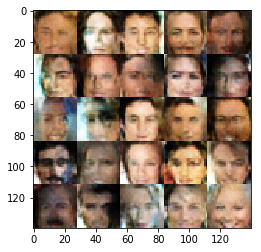

Epoch 1/1... Discriminator Loss: 1.4021... Generator Loss: 0.7817
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.6997
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.7276
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.8469
Epoch 1/1... Discriminator Loss: 1.3447... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.4189... Generator Loss: 0.8298
Epoch 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.7892
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 0.8186
Epoch 1/1... Discriminator Loss: 1.4752... Generator Loss: 0.7494


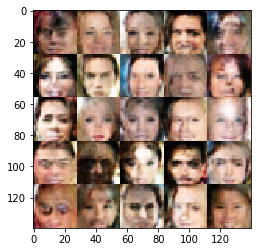

Epoch 1/1... Discriminator Loss: 1.4181... Generator Loss: 0.7801
Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.8218
Epoch 1/1... Discriminator Loss: 1.3827... Generator Loss: 0.7817
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.7161
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.6875
Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.8100
Epoch 1/1... Discriminator Loss: 1.3569... Generator Loss: 0.8288
Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.7903
Epoch 1/1... Discriminator Loss: 1.3608... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 0.9351


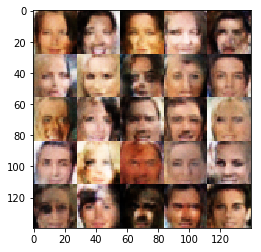

Epoch 1/1... Discriminator Loss: 1.3924... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.9263
Epoch 1/1... Discriminator Loss: 1.3645... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.4309... Generator Loss: 0.8179
Epoch 1/1... Discriminator Loss: 1.4894... Generator Loss: 0.6934
Epoch 1/1... Discriminator Loss: 1.4923... Generator Loss: 0.6795
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.8713
Epoch 1/1... Discriminator Loss: 1.3988... Generator Loss: 0.6973
Epoch 1/1... Discriminator Loss: 1.4578... Generator Loss: 0.7654
Epoch 1/1... Discriminator Loss: 1.4530... Generator Loss: 0.7065


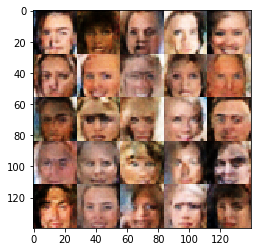

Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.8166
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.7032
Epoch 1/1... Discriminator Loss: 1.4052... Generator Loss: 0.7412
Epoch 1/1... Discriminator Loss: 1.4287... Generator Loss: 0.7616
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.9191
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.7437
Epoch 1/1... Discriminator Loss: 1.3489... Generator Loss: 0.8186
Epoch 1/1... Discriminator Loss: 1.3756... Generator Loss: 0.7203
Epoch 1/1... Discriminator Loss: 1.4166... Generator Loss: 0.8760
Epoch 1/1... Discriminator Loss: 1.3222... Generator Loss: 0.7499


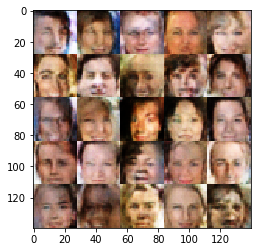

Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.7917
Epoch 1/1... Discriminator Loss: 1.4056... Generator Loss: 0.7989
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.7992
Epoch 1/1... Discriminator Loss: 1.4775... Generator Loss: 0.6252
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.8140
Epoch 1/1... Discriminator Loss: 1.2782... Generator Loss: 0.8532
Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.7972
Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.6867
Epoch 1/1... Discriminator Loss: 1.3963... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.4300... Generator Loss: 0.7045


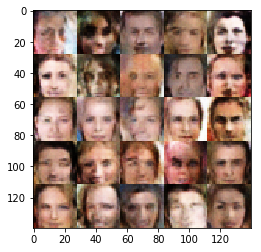

Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.7760
Epoch 1/1... Discriminator Loss: 1.4251... Generator Loss: 0.8021
Epoch 1/1... Discriminator Loss: 1.3166... Generator Loss: 0.7910
Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.3948... Generator Loss: 0.6640
Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.8005
Epoch 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.9061
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.7098
Epoch 1/1... Discriminator Loss: 1.5329... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.3499... Generator Loss: 0.7840


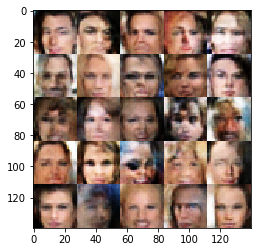

Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.7550
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.7359
Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.3111... Generator Loss: 0.7614
Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 0.8965
Epoch 1/1... Discriminator Loss: 1.4341... Generator Loss: 0.7849
Epoch 1/1... Discriminator Loss: 1.4416... Generator Loss: 0.7987
Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.8823
Epoch 1/1... Discriminator Loss: 1.4486... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 1.2743... Generator Loss: 0.8767


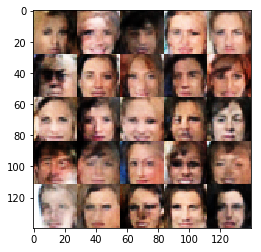

Epoch 1/1... Discriminator Loss: 1.4338... Generator Loss: 0.7537
Epoch 1/1... Discriminator Loss: 1.3305... Generator Loss: 0.7728
Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.7951
Epoch 1/1... Discriminator Loss: 1.4081... Generator Loss: 0.5965
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.7818
Epoch 1/1... Discriminator Loss: 1.4327... Generator Loss: 0.7686
Epoch 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.7878
Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 0.7890
Epoch 1/1... Discriminator Loss: 1.2098... Generator Loss: 0.8859


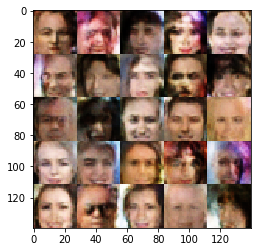

Epoch 1/1... Discriminator Loss: 1.4190... Generator Loss: 0.8704
Epoch 1/1... Discriminator Loss: 1.3032... Generator Loss: 0.8788
Epoch 1/1... Discriminator Loss: 1.4244... Generator Loss: 0.8740
Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.4311... Generator Loss: 0.7694
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.7482
Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.7811
Epoch 1/1... Discriminator Loss: 1.4458... Generator Loss: 0.8130
Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.7657


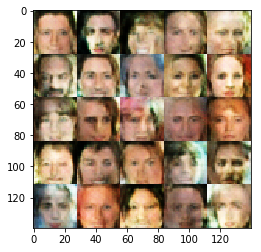

Epoch 1/1... Discriminator Loss: 1.5004... Generator Loss: 0.7202
Epoch 1/1... Discriminator Loss: 1.3722... Generator Loss: 0.8618
Epoch 1/1... Discriminator Loss: 1.3525... Generator Loss: 0.7641
Epoch 1/1... Discriminator Loss: 1.3844... Generator Loss: 0.8234
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.6946
Epoch 1/1... Discriminator Loss: 1.4766... Generator Loss: 0.7271
Epoch 1/1... Discriminator Loss: 1.4029... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 1.3369... Generator Loss: 0.8444
Epoch 1/1... Discriminator Loss: 1.4082... Generator Loss: 0.6978
Epoch 1/1... Discriminator Loss: 1.3653... Generator Loss: 0.7778


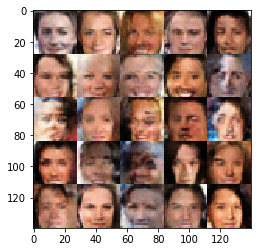

Epoch 1/1... Discriminator Loss: 1.4287... Generator Loss: 0.7375
Epoch 1/1... Discriminator Loss: 1.4006... Generator Loss: 0.8068
Epoch 1/1... Discriminator Loss: 1.4275... Generator Loss: 0.6753
Epoch 1/1... Discriminator Loss: 1.3143... Generator Loss: 0.7691
Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 0.7650
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.7593
Epoch 1/1... Discriminator Loss: 1.3652... Generator Loss: 0.7318
Epoch 1/1... Discriminator Loss: 1.5157... Generator Loss: 0.6849
Epoch 1/1... Discriminator Loss: 1.3974... Generator Loss: 0.8126
Epoch 1/1... Discriminator Loss: 1.2744... Generator Loss: 0.9141


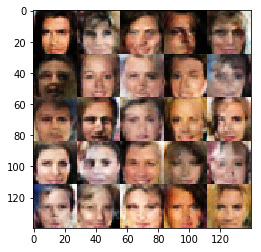

Epoch 1/1... Discriminator Loss: 1.1885... Generator Loss: 0.8638
Epoch 1/1... Discriminator Loss: 1.4333... Generator Loss: 0.8035
Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.7422
Epoch 1/1... Discriminator Loss: 1.4116... Generator Loss: 0.8243
Epoch 1/1... Discriminator Loss: 1.2910... Generator Loss: 0.9379
Epoch 1/1... Discriminator Loss: 1.3895... Generator Loss: 0.8695
Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.6960
Epoch 1/1... Discriminator Loss: 1.3432... Generator Loss: 0.7395
Epoch 1/1... Discriminator Loss: 1.4873... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 1.4663... Generator Loss: 0.6694


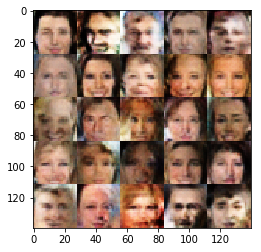

Epoch 1/1... Discriminator Loss: 1.4396... Generator Loss: 0.7738
Epoch 1/1... Discriminator Loss: 1.4439... Generator Loss: 0.8056
Epoch 1/1... Discriminator Loss: 1.4640... Generator Loss: 0.6608
Epoch 1/1... Discriminator Loss: 1.2329... Generator Loss: 0.8320
Epoch 1/1... Discriminator Loss: 1.3124... Generator Loss: 0.8562
Epoch 1/1... Discriminator Loss: 1.3454... Generator Loss: 0.7532
Epoch 1/1... Discriminator Loss: 1.3727... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.3600... Generator Loss: 0.7441
Epoch 1/1... Discriminator Loss: 1.4613... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.7969


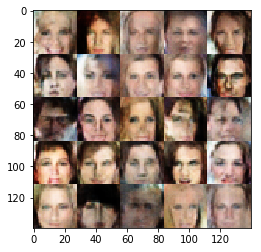

Epoch 1/1... Discriminator Loss: 1.2740... Generator Loss: 0.9369
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.7464
Epoch 1/1... Discriminator Loss: 1.3739... Generator Loss: 0.7567
Epoch 1/1... Discriminator Loss: 1.2940... Generator Loss: 0.8315
Epoch 1/1... Discriminator Loss: 1.2955... Generator Loss: 0.9055
Epoch 1/1... Discriminator Loss: 1.3993... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.3340... Generator Loss: 0.7311
Epoch 1/1... Discriminator Loss: 1.4112... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 1.4461... Generator Loss: 0.7138


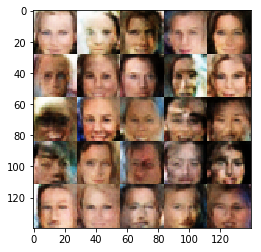

Epoch 1/1... Discriminator Loss: 1.4442... Generator Loss: 0.6919
Epoch 1/1... Discriminator Loss: 1.3032... Generator Loss: 0.7197
Epoch 1/1... Discriminator Loss: 1.3418... Generator Loss: 0.7617
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.7414
Epoch 1/1... Discriminator Loss: 1.3119... Generator Loss: 0.8636
Epoch 1/1... Discriminator Loss: 1.5491... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.3699... Generator Loss: 0.7430
Epoch 1/1... Discriminator Loss: 1.3620... Generator Loss: 0.8380
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.7960
Epoch 1/1... Discriminator Loss: 1.4235... Generator Loss: 0.7709


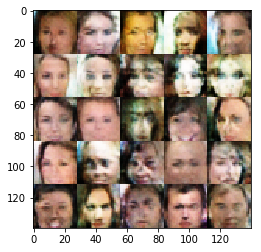

Epoch 1/1... Discriminator Loss: 1.3948... Generator Loss: 0.7226
Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 0.8112
Epoch 1/1... Discriminator Loss: 1.4157... Generator Loss: 0.8261
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.8116
Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.2960... Generator Loss: 0.7900
Epoch 1/1... Discriminator Loss: 1.4185... Generator Loss: 0.6523
Epoch 1/1... Discriminator Loss: 1.3366... Generator Loss: 0.7102
Epoch 1/1... Discriminator Loss: 1.3977... Generator Loss: 0.7593
Epoch 1/1... Discriminator Loss: 1.2863... Generator Loss: 0.9518


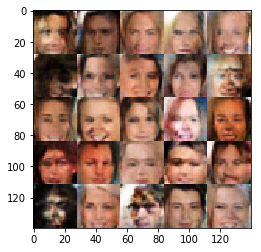

Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 0.8111
Epoch 1/1... Discriminator Loss: 1.2676... Generator Loss: 0.7707
Epoch 1/1... Discriminator Loss: 1.3682... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.3600... Generator Loss: 0.7710
Epoch 1/1... Discriminator Loss: 1.3703... Generator Loss: 0.7717
Epoch 1/1... Discriminator Loss: 1.3457... Generator Loss: 0.8512
Epoch 1/1... Discriminator Loss: 1.2771... Generator Loss: 0.8087
Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.7657
Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 0.7466
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.7574


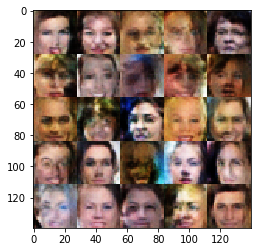

Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.7229
Epoch 1/1... Discriminator Loss: 1.3451... Generator Loss: 0.7205
Epoch 1/1... Discriminator Loss: 1.4415... Generator Loss: 0.7448
Epoch 1/1... Discriminator Loss: 1.4257... Generator Loss: 0.7956
Epoch 1/1... Discriminator Loss: 1.4536... Generator Loss: 0.6729
Epoch 1/1... Discriminator Loss: 1.4534... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 1.3434... Generator Loss: 0.7029
Epoch 1/1... Discriminator Loss: 1.3648... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.7897
Epoch 1/1... Discriminator Loss: 1.3729... Generator Loss: 0.7180


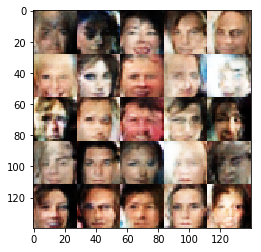

Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.8793
Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 0.8603
Epoch 1/1... Discriminator Loss: 1.4227... Generator Loss: 0.6887
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.7441
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.6827
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.7339
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.7699
Epoch 1/1... Discriminator Loss: 1.3560... Generator Loss: 0.7765
Epoch 1/1... Discriminator Loss: 1.3383... Generator Loss: 0.8796


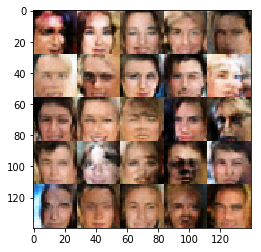

Epoch 1/1... Discriminator Loss: 1.3787... Generator Loss: 0.8299
Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 0.7388
Epoch 1/1... Discriminator Loss: 1.5597... Generator Loss: 0.6536
Epoch 1/1... Discriminator Loss: 1.4217... Generator Loss: 0.6637
Epoch 1/1... Discriminator Loss: 1.4881... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.7846
Epoch 1/1... Discriminator Loss: 1.4123... Generator Loss: 0.6889
Epoch 1/1... Discriminator Loss: 1.2153... Generator Loss: 0.8905
Epoch 1/1... Discriminator Loss: 1.3140... Generator Loss: 0.7522
Epoch 1/1... Discriminator Loss: 1.4758... Generator Loss: 0.7354


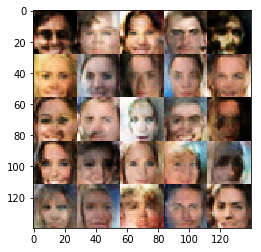

Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.7420
Epoch 1/1... Discriminator Loss: 1.3732... Generator Loss: 0.7884
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.7049
Epoch 1/1... Discriminator Loss: 1.3646... Generator Loss: 0.8062
Epoch 1/1... Discriminator Loss: 1.3201... Generator Loss: 0.8921
Epoch 1/1... Discriminator Loss: 1.3290... Generator Loss: 0.7687
Epoch 1/1... Discriminator Loss: 1.4686... Generator Loss: 0.7782
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.7116
Epoch 1/1... Discriminator Loss: 1.3507... Generator Loss: 0.7267
Epoch 1/1... Discriminator Loss: 1.3290... Generator Loss: 0.8172


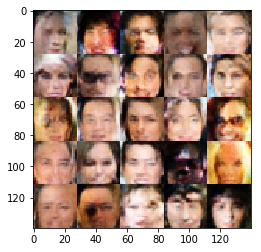

Epoch 1/1... Discriminator Loss: 1.3571... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.7944
Epoch 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.7145
Epoch 1/1... Discriminator Loss: 1.3846... Generator Loss: 0.7627
Epoch 1/1... Discriminator Loss: 1.4471... Generator Loss: 0.7594
Epoch 1/1... Discriminator Loss: 1.3624... Generator Loss: 0.9031
Epoch 1/1... Discriminator Loss: 1.3109... Generator Loss: 0.8111
Epoch 1/1... Discriminator Loss: 1.3062... Generator Loss: 0.7935
Epoch 1/1... Discriminator Loss: 1.2556... Generator Loss: 0.9463
Epoch 1/1... Discriminator Loss: 1.3397... Generator Loss: 0.8337


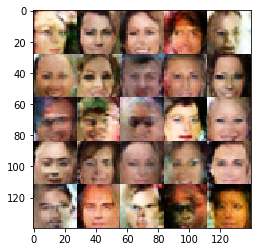

Epoch 1/1... Discriminator Loss: 1.3404... Generator Loss: 0.8512
Epoch 1/1... Discriminator Loss: 1.3191... Generator Loss: 0.8728
Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.7944
Epoch 1/1... Discriminator Loss: 1.4469... Generator Loss: 0.7966
Epoch 1/1... Discriminator Loss: 1.3453... Generator Loss: 0.8805
Epoch 1/1... Discriminator Loss: 1.4886... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.2581... Generator Loss: 0.8103
Epoch 1/1... Discriminator Loss: 1.3125... Generator Loss: 0.8789
Epoch 1/1... Discriminator Loss: 1.4191... Generator Loss: 0.7397


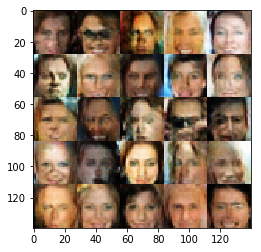

Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 0.6732
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 0.7087
Epoch 1/1... Discriminator Loss: 1.4761... Generator Loss: 0.7351
Epoch 1/1... Discriminator Loss: 1.2888... Generator Loss: 0.8211
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.4591... Generator Loss: 0.7243
Epoch 1/1... Discriminator Loss: 1.4516... Generator Loss: 0.7603
Epoch 1/1... Discriminator Loss: 1.4171... Generator Loss: 0.7103
Epoch 1/1... Discriminator Loss: 1.4881... Generator Loss: 0.7483
Epoch 1/1... Discriminator Loss: 1.4585... Generator Loss: 0.7259


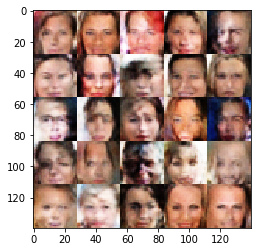

Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.7505
Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.8123
Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 0.8921
Epoch 1/1... Discriminator Loss: 1.3165... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 1.2814... Generator Loss: 0.8474
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.7989
Epoch 1/1... Discriminator Loss: 1.3777... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.4423... Generator Loss: 0.8281
Epoch 1/1... Discriminator Loss: 1.3406... Generator Loss: 0.8338


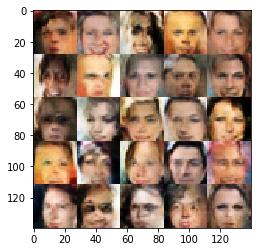

Epoch 1/1... Discriminator Loss: 1.3447... Generator Loss: 0.7693
Epoch 1/1... Discriminator Loss: 1.4944... Generator Loss: 0.7736
Epoch 1/1... Discriminator Loss: 1.2682... Generator Loss: 0.7001
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.8058
Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.7113
Epoch 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.9785
Epoch 1/1... Discriminator Loss: 1.3466... Generator Loss: 0.8215
Epoch 1/1... Discriminator Loss: 1.3194... Generator Loss: 0.7785
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.4758... Generator Loss: 0.6646


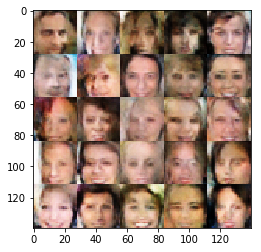

Epoch 1/1... Discriminator Loss: 1.3842... Generator Loss: 0.7164
Epoch 1/1... Discriminator Loss: 1.2674... Generator Loss: 0.8628
Epoch 1/1... Discriminator Loss: 1.4216... Generator Loss: 0.6776
Epoch 1/1... Discriminator Loss: 1.3916... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.9209
Epoch 1/1... Discriminator Loss: 1.4539... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.4305... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 1.2684... Generator Loss: 0.8617
Epoch 1/1... Discriminator Loss: 1.4325... Generator Loss: 0.7581
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.8716


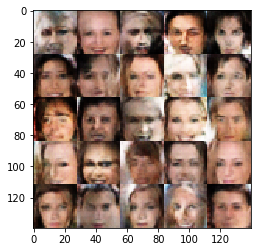

Epoch 1/1... Discriminator Loss: 1.4477... Generator Loss: 0.8111
Epoch 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.7378
Epoch 1/1... Discriminator Loss: 1.4724... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.3455... Generator Loss: 0.9068
Epoch 1/1... Discriminator Loss: 1.4361... Generator Loss: 0.6680
Epoch 1/1... Discriminator Loss: 1.3584... Generator Loss: 0.7093
Epoch 1/1... Discriminator Loss: 1.5401... Generator Loss: 0.6476
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.8016
Epoch 1/1... Discriminator Loss: 1.3524... Generator Loss: 0.8827
Epoch 1/1... Discriminator Loss: 1.3399... Generator Loss: 0.7601


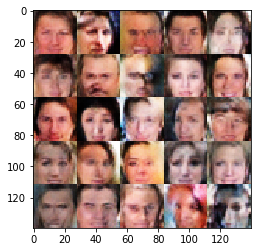

Epoch 1/1... Discriminator Loss: 1.4710... Generator Loss: 0.6344
Epoch 1/1... Discriminator Loss: 1.3334... Generator Loss: 0.8652
Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 0.8081
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.7732
Epoch 1/1... Discriminator Loss: 1.2674... Generator Loss: 0.8216
Epoch 1/1... Discriminator Loss: 1.2929... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 1.2428... Generator Loss: 0.8036
Epoch 1/1... Discriminator Loss: 1.4338... Generator Loss: 0.7421
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.7123
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 0.6990


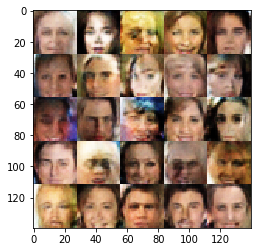

Epoch 1/1... Discriminator Loss: 1.3583... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.3182... Generator Loss: 0.7337
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.7892
Epoch 1/1... Discriminator Loss: 1.4051... Generator Loss: 0.7085
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.8043
Epoch 1/1... Discriminator Loss: 1.4241... Generator Loss: 0.7455
Epoch 1/1... Discriminator Loss: 1.4237... Generator Loss: 0.7310
Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.9015
Epoch 1/1... Discriminator Loss: 1.3543... Generator Loss: 0.7905


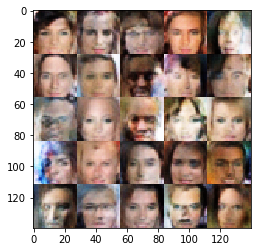

Epoch 1/1... Discriminator Loss: 1.4204... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.3541... Generator Loss: 0.8501
Epoch 1/1... Discriminator Loss: 1.4074... Generator Loss: 0.8329
Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.6787
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.7644
Epoch 1/1... Discriminator Loss: 1.3142... Generator Loss: 0.9060
Epoch 1/1... Discriminator Loss: 1.3019... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.8282
Epoch 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.7331


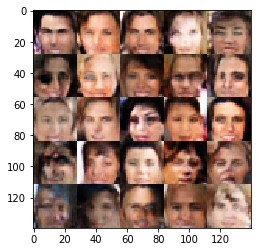

Epoch 1/1... Discriminator Loss: 1.3093... Generator Loss: 0.7980
Epoch 1/1... Discriminator Loss: 1.5090... Generator Loss: 0.6795
Epoch 1/1... Discriminator Loss: 1.3894... Generator Loss: 0.7835
Epoch 1/1... Discriminator Loss: 1.3255... Generator Loss: 0.8066
Epoch 1/1... Discriminator Loss: 1.3953... Generator Loss: 0.7732
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.7176
Epoch 1/1... Discriminator Loss: 1.4359... Generator Loss: 0.7654
Epoch 1/1... Discriminator Loss: 1.1734... Generator Loss: 0.8902
Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 0.8400
Epoch 1/1... Discriminator Loss: 1.4150... Generator Loss: 0.7778


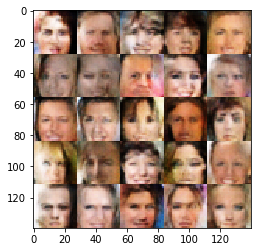

Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.8427
Epoch 1/1... Discriminator Loss: 1.3445... Generator Loss: 0.7229
Epoch 1/1... Discriminator Loss: 1.6334... Generator Loss: 0.6991
Epoch 1/1... Discriminator Loss: 1.2970... Generator Loss: 0.8009
Epoch 1/1... Discriminator Loss: 1.3094... Generator Loss: 0.8570
Epoch 1/1... Discriminator Loss: 1.3347... Generator Loss: 0.8089
Epoch 1/1... Discriminator Loss: 1.4802... Generator Loss: 0.6666
Epoch 1/1... Discriminator Loss: 1.1550... Generator Loss: 0.9555
Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.7310
Epoch 1/1... Discriminator Loss: 1.3439... Generator Loss: 0.8242


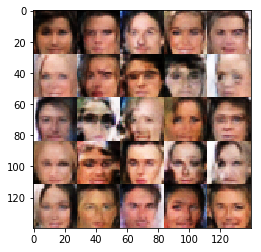

Epoch 1/1... Discriminator Loss: 1.3344... Generator Loss: 0.8187
Epoch 1/1... Discriminator Loss: 1.4223... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 1.3635... Generator Loss: 0.7119
Epoch 1/1... Discriminator Loss: 1.3474... Generator Loss: 1.0087
Epoch 1/1... Discriminator Loss: 1.4846... Generator Loss: 0.6978
Epoch 1/1... Discriminator Loss: 1.5038... Generator Loss: 0.6677
Epoch 1/1... Discriminator Loss: 1.4937... Generator Loss: 0.6711
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.7798
Epoch 1/1... Discriminator Loss: 1.4069... Generator Loss: 0.6879
Epoch 1/1... Discriminator Loss: 1.1607... Generator Loss: 0.9293


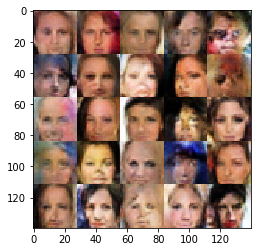

Epoch 1/1... Discriminator Loss: 1.4491... Generator Loss: 0.6956
Epoch 1/1... Discriminator Loss: 1.3574... Generator Loss: 0.7780
Epoch 1/1... Discriminator Loss: 1.4825... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.7963
Epoch 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.7333
Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.4720... Generator Loss: 0.8159
Epoch 1/1... Discriminator Loss: 1.4268... Generator Loss: 0.7992
Epoch 1/1... Discriminator Loss: 1.2653... Generator Loss: 0.8974
Epoch 1/1... Discriminator Loss: 1.3693... Generator Loss: 0.8610


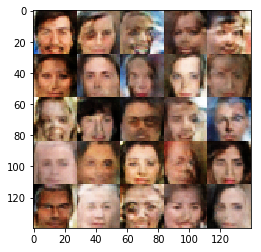

Epoch 1/1... Discriminator Loss: 1.4804... Generator Loss: 0.7740
Epoch 1/1... Discriminator Loss: 1.3936... Generator Loss: 0.7654
Epoch 1/1... Discriminator Loss: 1.4252... Generator Loss: 0.8110
Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.7626
Epoch 1/1... Discriminator Loss: 1.4138... Generator Loss: 0.7494
Epoch 1/1... Discriminator Loss: 1.3958... Generator Loss: 0.7917
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 0.8891
Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.7941
Epoch 1/1... Discriminator Loss: 1.4045... Generator Loss: 0.7046


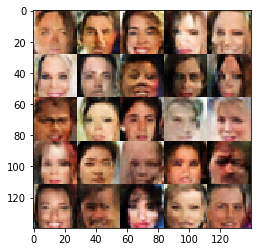

Epoch 1/1... Discriminator Loss: 1.4047... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.7920
Epoch 1/1... Discriminator Loss: 1.2944... Generator Loss: 0.9867
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.7884
Epoch 1/1... Discriminator Loss: 1.4666... Generator Loss: 0.7386
Epoch 1/1... Discriminator Loss: 1.2962... Generator Loss: 0.9081
Epoch 1/1... Discriminator Loss: 1.3325... Generator Loss: 0.8629
Epoch 1/1... Discriminator Loss: 1.3149... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 1.3444... Generator Loss: 0.7991
Epoch 1/1... Discriminator Loss: 1.2636... Generator Loss: 0.8853


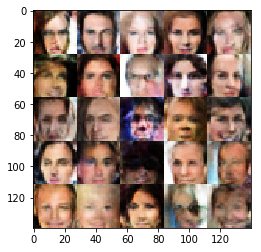

Epoch 1/1... Discriminator Loss: 1.4625... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.7572
Epoch 1/1... Discriminator Loss: 1.3364... Generator Loss: 0.8264
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.8740
Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 0.7808
Epoch 1/1... Discriminator Loss: 1.3245... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.8559
Epoch 1/1... Discriminator Loss: 1.2459... Generator Loss: 0.8311
Epoch 1/1... Discriminator Loss: 1.3182... Generator Loss: 0.7100
Epoch 1/1... Discriminator Loss: 1.5042... Generator Loss: 0.7034


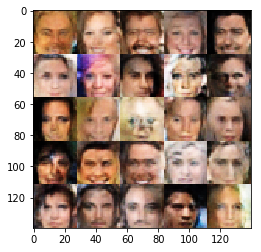

Epoch 1/1... Discriminator Loss: 1.2400... Generator Loss: 0.8671
Epoch 1/1... Discriminator Loss: 1.4834... Generator Loss: 0.6407
Epoch 1/1... Discriminator Loss: 1.4640... Generator Loss: 0.8104
Epoch 1/1... Discriminator Loss: 1.4070... Generator Loss: 0.8705
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.7020
Epoch 1/1... Discriminator Loss: 1.3333... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.1841... Generator Loss: 0.9532
Epoch 1/1... Discriminator Loss: 1.2098... Generator Loss: 0.9277
Epoch 1/1... Discriminator Loss: 1.3923... Generator Loss: 0.8603
Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.7151


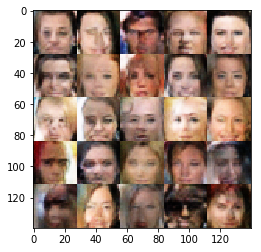

Epoch 1/1... Discriminator Loss: 1.4655... Generator Loss: 0.7323
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.6774
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.8033
Epoch 1/1... Discriminator Loss: 1.2927... Generator Loss: 0.8344
Epoch 1/1... Discriminator Loss: 1.4401... Generator Loss: 0.7779
Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.8549
Epoch 1/1... Discriminator Loss: 1.4508... Generator Loss: 0.8286
Epoch 1/1... Discriminator Loss: 1.2736... Generator Loss: 0.8975
Epoch 1/1... Discriminator Loss: 1.3140... Generator Loss: 0.8549
Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.7569


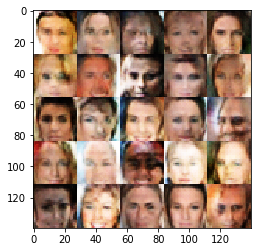

Epoch 1/1... Discriminator Loss: 1.3160... Generator Loss: 0.8434
Epoch 1/1... Discriminator Loss: 1.4982... Generator Loss: 0.7728
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.8335
Epoch 1/1... Discriminator Loss: 1.4257... Generator Loss: 0.8536
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 1.4015... Generator Loss: 0.7265
Epoch 1/1... Discriminator Loss: 1.3703... Generator Loss: 0.8877
Epoch 1/1... Discriminator Loss: 1.5058... Generator Loss: 0.7393
Epoch 1/1... Discriminator Loss: 1.4712... Generator Loss: 0.7001
Epoch 1/1... Discriminator Loss: 1.3579... Generator Loss: 0.9252


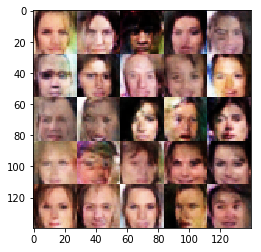

Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.7803
Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 0.9165
Epoch 1/1... Discriminator Loss: 1.3994... Generator Loss: 0.7939
Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 0.8877
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.3741... Generator Loss: 0.8094
Epoch 1/1... Discriminator Loss: 1.5521... Generator Loss: 0.7509
Epoch 1/1... Discriminator Loss: 1.5619... Generator Loss: 0.5892
Epoch 1/1... Discriminator Loss: 1.4492... Generator Loss: 0.8229
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.8433


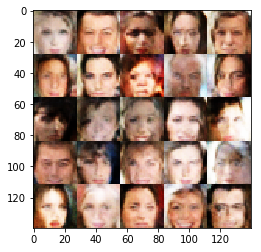

Epoch 1/1... Discriminator Loss: 1.3875... Generator Loss: 0.8133
Epoch 1/1... Discriminator Loss: 1.2815... Generator Loss: 0.8052
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.8112
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.7767
Epoch 1/1... Discriminator Loss: 1.3052... Generator Loss: 0.8265
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.7233
Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.8967
Epoch 1/1... Discriminator Loss: 1.3022... Generator Loss: 0.9730
Epoch 1/1... Discriminator Loss: 1.4193... Generator Loss: 0.8490
Epoch 1/1... Discriminator Loss: 1.4795... Generator Loss: 0.7213


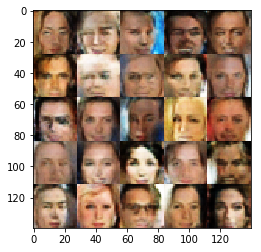

Epoch 1/1... Discriminator Loss: 1.2215... Generator Loss: 0.8757
Epoch 1/1... Discriminator Loss: 1.7123... Generator Loss: 0.6417
Epoch 1/1... Discriminator Loss: 1.5053... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 1.2838... Generator Loss: 0.9030
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.7657
Epoch 1/1... Discriminator Loss: 1.2770... Generator Loss: 0.8273
Epoch 1/1... Discriminator Loss: 1.2962... Generator Loss: 0.8057
Epoch 1/1... Discriminator Loss: 1.4055... Generator Loss: 0.8549
Epoch 1/1... Discriminator Loss: 1.3070... Generator Loss: 0.9703
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.7425


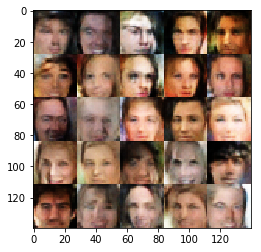

Epoch 1/1... Discriminator Loss: 1.5121... Generator Loss: 0.7592
Epoch 1/1... Discriminator Loss: 1.2351... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 1.3784... Generator Loss: 0.8323
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.7940
Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 0.7739
Epoch 1/1... Discriminator Loss: 1.3346... Generator Loss: 0.8370
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.8561
Epoch 1/1... Discriminator Loss: 1.3587... Generator Loss: 0.6739
Epoch 1/1... Discriminator Loss: 1.3819... Generator Loss: 0.7505


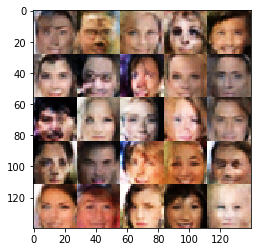

Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.7813
Epoch 1/1... Discriminator Loss: 1.3334... Generator Loss: 0.7926
Epoch 1/1... Discriminator Loss: 1.4140... Generator Loss: 0.7676
Epoch 1/1... Discriminator Loss: 1.5740... Generator Loss: 0.6258
Epoch 1/1... Discriminator Loss: 1.2570... Generator Loss: 0.9804
Epoch 1/1... Discriminator Loss: 1.2350... Generator Loss: 0.8611
Epoch 1/1... Discriminator Loss: 1.3075... Generator Loss: 0.8185
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.8558
Epoch 1/1... Discriminator Loss: 1.3320... Generator Loss: 0.7479


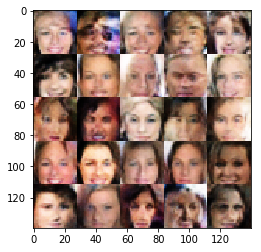

Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.7555
Epoch 1/1... Discriminator Loss: 1.4081... Generator Loss: 0.9297
Epoch 1/1... Discriminator Loss: 1.4418... Generator Loss: 0.6806
Epoch 1/1... Discriminator Loss: 1.4906... Generator Loss: 0.7250
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.4111... Generator Loss: 0.7639
Epoch 1/1... Discriminator Loss: 1.3192... Generator Loss: 0.8105
Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 0.8735
Epoch 1/1... Discriminator Loss: 1.4099... Generator Loss: 0.7327
Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.7858


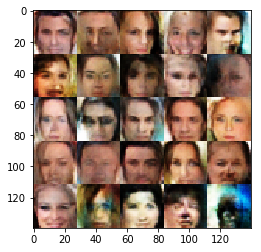

Epoch 1/1... Discriminator Loss: 1.4415... Generator Loss: 0.7928
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.7456
Epoch 1/1... Discriminator Loss: 1.4050... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.3150... Generator Loss: 0.8460
Epoch 1/1... Discriminator Loss: 1.3796... Generator Loss: 0.8168
Epoch 1/1... Discriminator Loss: 1.4791... Generator Loss: 0.8206
Epoch 1/1... Discriminator Loss: 1.4235... Generator Loss: 0.7545
Epoch 1/1... Discriminator Loss: 1.2212... Generator Loss: 0.8298
Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.7582
Epoch 1/1... Discriminator Loss: 1.3668... Generator Loss: 0.7167


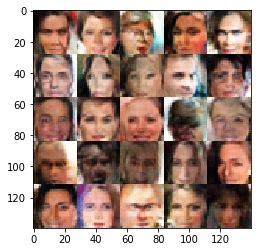

Epoch 1/1... Discriminator Loss: 1.4361... Generator Loss: 0.7973
Epoch 1/1... Discriminator Loss: 1.4424... Generator Loss: 0.8086
Epoch 1/1... Discriminator Loss: 1.3147... Generator Loss: 0.8897
Epoch 1/1... Discriminator Loss: 1.4214... Generator Loss: 0.8072
Epoch 1/1... Discriminator Loss: 1.3049... Generator Loss: 0.7598
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.8332
Epoch 1/1... Discriminator Loss: 1.1928... Generator Loss: 0.9537
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 0.7986
Epoch 1/1... Discriminator Loss: 1.3090... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.4890... Generator Loss: 0.6951


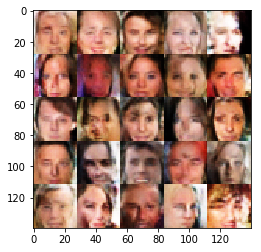

Epoch 1/1... Discriminator Loss: 1.2982... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.4293... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.3732... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.3594... Generator Loss: 0.7854
Epoch 1/1... Discriminator Loss: 1.3301... Generator Loss: 0.8133
Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.8299
Epoch 1/1... Discriminator Loss: 1.2865... Generator Loss: 0.8095
Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.8847
Epoch 1/1... Discriminator Loss: 1.3138... Generator Loss: 0.8202
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.8170


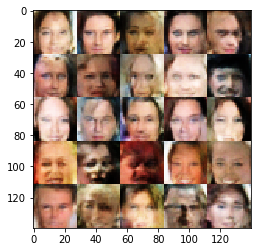

Epoch 1/1... Discriminator Loss: 1.5473... Generator Loss: 0.7550
Epoch 1/1... Discriminator Loss: 1.5575... Generator Loss: 0.6252
Epoch 1/1... Discriminator Loss: 1.2459... Generator Loss: 0.8230
Epoch 1/1... Discriminator Loss: 1.2370... Generator Loss: 0.8571
Epoch 1/1... Discriminator Loss: 1.2918... Generator Loss: 0.8824
Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.8461
Epoch 1/1... Discriminator Loss: 1.4205... Generator Loss: 0.7617
Epoch 1/1... Discriminator Loss: 1.2402... Generator Loss: 0.9136
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 1.4291... Generator Loss: 0.7484


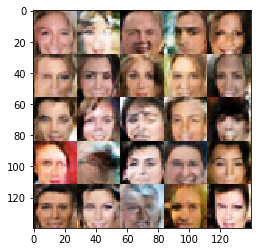

Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.7622
Epoch 1/1... Discriminator Loss: 1.3688... Generator Loss: 0.8101
Epoch 1/1... Discriminator Loss: 1.4253... Generator Loss: 0.6989
Epoch 1/1... Discriminator Loss: 1.3409... Generator Loss: 0.6478
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.7990
Epoch 1/1... Discriminator Loss: 1.4178... Generator Loss: 0.8367
Epoch 1/1... Discriminator Loss: 1.4140... Generator Loss: 0.8176
Epoch 1/1... Discriminator Loss: 1.4005... Generator Loss: 0.8290
Epoch 1/1... Discriminator Loss: 1.4549... Generator Loss: 0.7742
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 0.8953


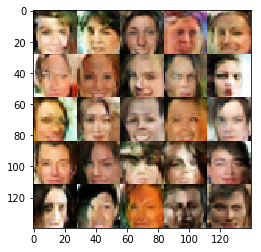

Epoch 1/1... Discriminator Loss: 1.4152... Generator Loss: 0.7867
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.8769
Epoch 1/1... Discriminator Loss: 1.4624... Generator Loss: 0.8298
Epoch 1/1... Discriminator Loss: 1.4673... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.2705... Generator Loss: 0.8557
Epoch 1/1... Discriminator Loss: 1.3721... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.4973... Generator Loss: 0.7706
Epoch 1/1... Discriminator Loss: 1.4021... Generator Loss: 0.7700
Epoch 1/1... Discriminator Loss: 1.1805... Generator Loss: 0.8793
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.7824


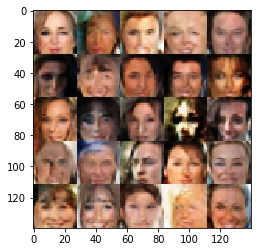

Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 1.4915... Generator Loss: 0.8776
Epoch 1/1... Discriminator Loss: 1.2846... Generator Loss: 0.8233
Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 0.7034
Epoch 1/1... Discriminator Loss: 1.4301... Generator Loss: 0.7606
Epoch 1/1... Discriminator Loss: 1.2691... Generator Loss: 0.8162
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.7954
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 0.8281
Epoch 1/1... Discriminator Loss: 1.3408... Generator Loss: 0.8254
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.8318


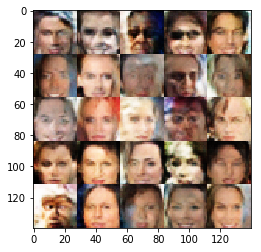

Epoch 1/1... Discriminator Loss: 1.2023... Generator Loss: 0.9300
Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 0.8678
Epoch 1/1... Discriminator Loss: 1.4420... Generator Loss: 0.7534
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.7863
Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 0.8304
Epoch 1/1... Discriminator Loss: 1.2957... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 1.2122... Generator Loss: 0.8738
Epoch 1/1... Discriminator Loss: 1.4113... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.7462
Epoch 1/1... Discriminator Loss: 1.4045... Generator Loss: 0.8435


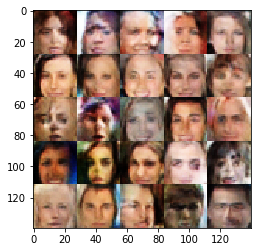

Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.8014
Epoch 1/1... Discriminator Loss: 1.3733... Generator Loss: 0.7873
Epoch 1/1... Discriminator Loss: 1.4438... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.8010
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 1.4540... Generator Loss: 0.8093
Epoch 1/1... Discriminator Loss: 1.3294... Generator Loss: 0.8644
Epoch 1/1... Discriminator Loss: 1.4100... Generator Loss: 0.8274
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.3684... Generator Loss: 0.8418


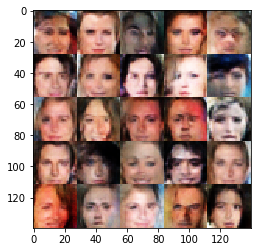

Epoch 1/1... Discriminator Loss: 1.4326... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.4054... Generator Loss: 0.7143
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.2756... Generator Loss: 0.9288
Epoch 1/1... Discriminator Loss: 1.3507... Generator Loss: 0.7584
Epoch 1/1... Discriminator Loss: 1.3323... Generator Loss: 0.8356
Epoch 1/1... Discriminator Loss: 1.3153... Generator Loss: 0.7599
Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.6729
Epoch 1/1... Discriminator Loss: 1.2577... Generator Loss: 0.8223
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.8346


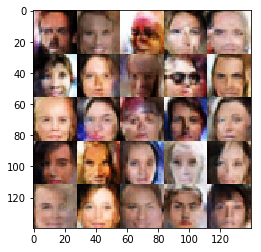

Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 0.8025
Epoch 1/1... Discriminator Loss: 1.2719... Generator Loss: 0.9119
Epoch 1/1... Discriminator Loss: 1.3520... Generator Loss: 0.9024
Epoch 1/1... Discriminator Loss: 1.3835... Generator Loss: 0.6654
Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.8329


In [25]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。